In [1]:
import matplotlib.pyplot as plt
import numpy as np
import edward as ed
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import numpy as np
import os
import tensorflow as tf
from edward.models import Categorical, Normal, Uniform
import edward as ed
from tensorflow.contrib import slim

%load_ext autoreload
%autoreload 2
%matplotlib inline

/media/data-disk/anaconda3/envs/pmi36_krzysiek/lib/python3.6/importlib/_bootstrap.py:205: RuntimeWarning: compiletime version 3.5 of module 'tensorflow.python.framework.fast_tensor_util' does not match runtime version 3.6
  return f(*args, **kwds)


In [2]:
import keras
keras.__version__, ed.__version__, tf.__version__

Using TensorFlow backend.


('2.0.9', '1.3.4', '1.4.0')

# Load fashion mnist dataset

In [3]:
from tensorflow.examples.tutorials.mnist import input_data
fmnist = input_data.read_data_sets('fashion-mnist/')

Extracting fashion-mnist/train-images-idx3-ubyte.gz
Extracting fashion-mnist/train-labels-idx1-ubyte.gz
Extracting fashion-mnist/t10k-images-idx3-ubyte.gz
Extracting fashion-mnist/t10k-labels-idx1-ubyte.gz


In [4]:
fmnist.train.num_examples

55000

# Simple example of one layer neural network in Edward

This example was copied from:
https://alpha-i.co/blog/MNIST-for-ML-beginners-The-Bayesian-Way.html

In [5]:
N = 100   # number of images in a minibatch.
D = 784   # number of features.
K = 10    # number of classes.

# placeholders
x_input = tf.placeholder(tf.float32, [None, D])
y_label = tf.placeholder(tf.int32, [N])

# priors
w = Normal(loc=tf.zeros([D, K]), scale=tf.ones([D, K]))
b = Normal(loc=tf.zeros(K), scale=tf.ones(K))

# Categorical likelihood for classication.
y = Categorical(tf.matmul(x_input, w) + b)

## Posteriors

In [6]:
# Construct the q(w) and q(b). In this case we assume Normal distributions.
qw = Normal(
    loc=tf.Variable(tf.random_normal([D, K])),
    scale=tf.nn.softplus(tf.Variable(tf.random_normal([D, K])))
) 
qb = Normal(
    loc=tf.Variable(tf.random_normal([K])),
    scale=tf.nn.softplus(tf.Variable(tf.random_normal([K])))
)

In [7]:
# Define the VI inference technique, ie. minimise the KL divergence between q and p.
inference = ed.KLqp({w: qw, b: qb}, data={y: y_label})

In [8]:
# Initialse the inference variables
inference.initialize(
    n_iter=5000, 
    n_print=100, 
    scale={y: float(fmnist.train.num_examples) / N}
)

## Train the model

In [9]:
sess = tf.InteractiveSession()
tf.global_variables_initializer().run()

# Let the training begin. We load the data in minibatches 
# and update the VI infernce using each new batch.

for _ in range(inference.n_iter):
    X_batch, Y_batch = fmnist.train.next_batch(N)        
    info_dict = inference.update(feed_dict={x_input: X_batch, y_label: Y_batch})
    inference.print_progress(info_dict)

5000/5000 [100%] ██████████████████████████████ Elapsed: 13s | Loss: 45707.742


## Testing model

In [10]:
# Load the test images.
X_test = fmnist.test.images
Y_test = fmnist.test.labels
X_test.shape, Y_test.shape

((10000, 784), (10000,))

In [11]:
sess.run(y, feed_dict={x_input: X_test[:32]})

array([5, 1, 0, 0, 3, 0, 0, 1, 6, 6, 6, 5, 4, 6, 1, 6, 5, 6, 6, 6, 1, 6, 5,
       1, 0, 6, 6, 0, 5, 6, 6, 1], dtype=int32)

## Generate samples the posterior and store them

In [12]:
n_samples = 100
num_examples = 512
prob_lst = []

for _ in range(n_samples):
    w_samp = qw.sample()
    b_samp = qb.sample()
    
    # Compute the probabiliy of each class for each (w,b) sample.
    prob = tf.nn.softmax(tf.matmul( X_test[:num_examples], w_samp ) + b_samp)
    prob_lst.append(prob.eval())

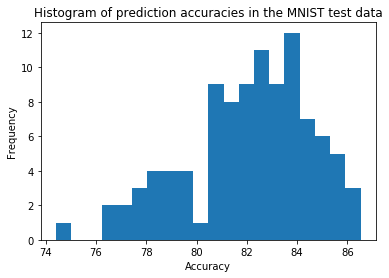

In [13]:
# Compute the accuracy of the model. 
# For each sample we compute the predicted class and compare with the test labels.
# Predicted class is defined as the one which as maximum proability.
# We perform this test for each (w,b) in the posterior giving us a set of accuracies
# Finally we make a histogram of accuracies for the test data.
accy_test = []
for prob in prob_lst:
    y_trn_prd = np.argmax(prob, axis=1).astype(np.float32)
    acc = (y_trn_prd == Y_test[:num_examples]).mean()*100
    accy_test.append(acc)

plt.hist(accy_test, bins=20)
plt.title("Histogram of prediction accuracies in the MNIST test data")
plt.xlabel("Accuracy")
plt.ylabel("Frequency")

## Bayesian networks - same problem but with mine simple API

In [14]:
# We will use an interactive session.
from keras import backend as K
sess = K.get_session()

In [15]:
from utils.layers import bayesian_dense, bayesian_categorical
from utils.edward_utils import get_edward_data

N = 100   # number of images in a minibatch.
D = 784   # number of features.
K = 10    # number of classes.

x_input = tf.placeholder(tf.float32, [None, D])
y_label = tf.placeholder(tf.int32, [N])

bayes_params = {}
# 1-st layer
x, qx, bayes_params['dense1'] = bayesian_dense(
    x_input, x_input, 256, kl_scaling=0.3, 
    activation=tf.nn.relu, name='dense1')

# 2-nd layer
x, qx, bayes_params['dense2'] = bayesian_dense(
    x, qx, K, activation=tf.identity, name='dense2')

# Categorical classes
y, qy = bayesian_categorical(x, qx)

# Things which we need to initialize the inference object
# in Edward
posteriors, kl_scaling = get_edward_data(bayes_params)

In [16]:
posteriors

{<ed.RandomVariable 'Normal_4/' shape=(784, 256) dtype=float32>: <ed.RandomVariable 'Normal_6/' shape=(784, 256) dtype=float32>,
 <ed.RandomVariable 'Normal_5/' shape=(256,) dtype=float32>: <ed.RandomVariable 'Normal_7/' shape=(256,) dtype=float32>,
 <ed.RandomVariable 'Normal_8/' shape=(256, 10) dtype=float32>: <ed.RandomVariable 'Normal_10/' shape=(256, 10) dtype=float32>,
 <ed.RandomVariable 'Normal_9/' shape=(10,) dtype=float32>: <ed.RandomVariable 'Normal_11/' shape=(10,) dtype=float32>}

## First check - train same network doing MLE
This should converge if not probably Edward will also fail

In [ ]:
# W*y = (Wm + e * Ws*0) * y

0 55000 [None, 2.4749722, 0.1]
2000 55000 [None, 0.35944146, 0.88]
4000 55000 [None, 0.30338794, 0.91000003]
6000 55000 [None, 0.18737513, 0.92000002]
8000 55000 [None, 0.31041884, 0.92000002]
10000 55000 [None, 0.20363475, 0.92000002]
12000 55000 [None, 0.1646426, 0.94999999]
14000 55000 [None, 0.30984098, 0.91000003]
16000 55000 [None, 0.12382129, 0.95999998]
18000 55000 [None, 0.12468865, 0.93000001]
20000 55000 [None, 0.23935576, 0.94]
22000 55000 [None, 0.11578881, 0.94999999]
24000 55000 [None, 0.16189419, 0.94]
26000 55000 [None, 0.22777618, 0.92000002]
28000 55000 [None, 0.19168338, 0.92000002]
30000 55000 [None, 0.17958723, 0.95999998]
32000 55000 [None, 0.083688408, 0.97000003]
34000 55000 [None, 0.13894503, 0.97000003]
36000 55000 [None, 0.18301576, 0.94]
38000 55000 [None, 0.13298483, 0.95999998]
40000 55000 [None, 0.18326044, 0.93000001]
42000 55000 [None, 0.10670035, 0.94999999]
44000 55000 [None, 0.058713622, 0.98000002]
46000 55000 [None, 0.10903248, 0.95999998]
48000 5

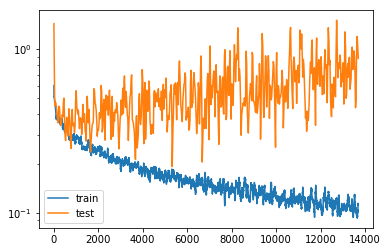

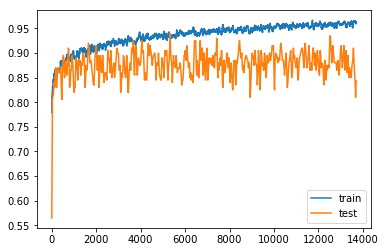

In [17]:
from utils.test_utils import train_mle_network

hist = train_mle_network(
    sess, qx, x_input, y_label, 
    fmnist, 
    batch_size=N, 
    num_epochs=100
)

In [20]:
np.array(hist['test'])[:, 2].shape, np.mean(np.array(hist['test'])[:, 2][-10000:])

((55000,), 0.88240000247955319)

### Print example matrix parameters

In [21]:
stddev = posteriors[list(posteriors.keys())[0]].stddev()
mean = posteriors[list(posteriors.keys())[0]].mean()
sess.run(stddev)

array([[ 0.00668634,  0.00671535,  0.00738699, ...,  0.00696126,
         0.00671535,  0.00646926],
       [ 0.00862209,  0.00671535,  0.00845283, ...,  0.00452198,
         0.00667698,  0.00456826],
       [ 0.00782839,  0.00670813,  0.00552354, ...,  0.01495801,
         0.00732534,  0.00573904],
       ..., 
       [ 0.00823448,  0.00645789,  0.00501102, ...,  0.03305383,
         0.00558566,  0.00304497],
       [ 0.0048166 ,  0.00654044,  0.00662689, ...,  0.00859998,
         0.00623436,  0.01396938],
       [ 0.00729623,  0.00675478,  0.00636645, ...,  0.00860448,
         0.00779421,  0.0184496 ]], dtype=float32)

## Train model with Edward

In [22]:
from utils.test_utils import train_edward_model

ed_inference = train_edward_model(
        sess=sess,
        qx=qx,
        x_input=x_input, 
        y_label=y_label,
        y_pred=y,
        posteriors=posteriors,
        kl_scaling=kl_scaling,
        label_mapping={y: y_label},
        mnist=fmnist,
        batch_size=N,
        num_epochs=100,
        num_samples=5
)

 test_acc: 0.3499999940395355
  500/55000 [  0%]                                ETA: 554s | Loss: 97960.852  test_acc: 0.9200000166893005
 1000/55000 [  1%]                                ETA: 436s | Loss: 60296.078 test_acc: 0.8199999928474426
 1500/55000 [  2%]                                ETA: 395s | Loss: 47374.516 test_acc: 0.9100000262260437
 2000/55000 [  3%] █                              ETA: 372s | Loss: 37380.594 test_acc: 0.8600000143051147
 2500/55000 [  4%] █                              ETA: 358s | Loss: 35560.258 test_acc: 0.8100000023841858
 3000/55000 [  5%] █                              ETA: 350s | Loss: 35802.957 test_acc: 0.8399999737739563
 3500/55000 [  6%] █                              ETA: 340s | Loss: 29317.719 test_acc: 0.8899999856948853
 4000/55000 [  7%] ██                             ETA: 336s | Loss: 24398.160 test_acc: 0.8899999856948853
 4500/55000 [  8%] ██                             ETA: 329s | Loss: 25597.074 test_acc: 0.8799999952316284
 5000/

### Print example matrix

In [24]:
sess.run(posteriors[list(posteriors.keys())[0]])

array([[-0.02740432,  0.35816947, -1.95451856, ...,  0.54095829,
         1.08941615,  0.72340447],
       [-1.51629138, -0.776272  ,  0.36893046, ..., -0.42379487,
        -0.03993573,  0.38573068],
       [-0.77942061,  0.63199997, -0.47022405, ..., -0.47852224,
        -0.4235678 , -0.41362348],
       ..., 
       [ 0.938178  , -0.43611321, -0.10475995, ...,  0.7157017 ,
        -0.05000865, -1.00367475],
       [-0.71396273, -0.19908698,  2.23471189, ...,  1.42261922,
         0.355252  , -0.72239524],
       [ 1.06602669, -0.86956978, -0.69036698, ...,  1.14230573,
        -1.12010276,  0.64641517]], dtype=float32)

## Test model 

In [25]:
X_test = fmnist.test.images
Y_test = fmnist.test.labels
X_test.shape, Y_test.shape

((10000, 784), (10000,))

In [26]:
Y_test[:32]

array([6, 4, 5, 8, 7, 2, 8, 1, 0, 3, 7, 6, 0, 4, 2, 6, 6, 0, 9, 2, 2, 2, 1,
       8, 3, 8, 1, 6, 6, 6, 0, 1], dtype=uint8)

In [27]:
sess.run(qy, feed_dict={x_input: X_test[:32]})

array([6, 4, 5, 8, 7, 2, 8, 1, 0, 3, 7, 6, 6, 4, 2, 4, 4, 0, 9, 2, 6, 2, 1,
       8, 3, 8, 1, 8, 2, 6, 6, 1], dtype=int32)

In [28]:
from utils.test_utils import compute_test_acc, plot_predictions

compute_test_acc(
        sess=sess,
        output_tensor=qx,
        x_input=x_input,
        mnist=fmnist
)

0.85719999999999996

BAD PREDICTION


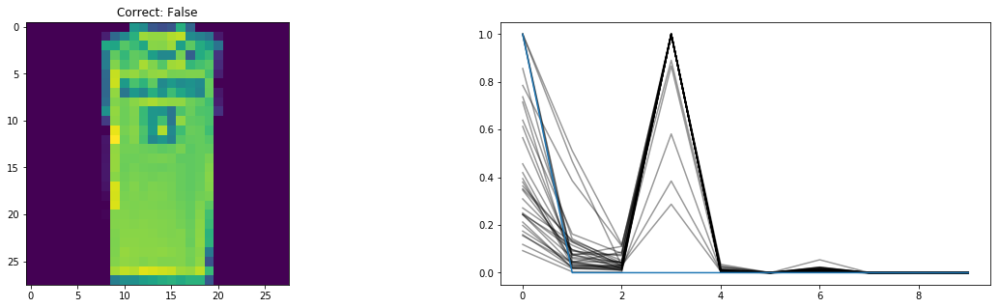

BAD PREDICTION


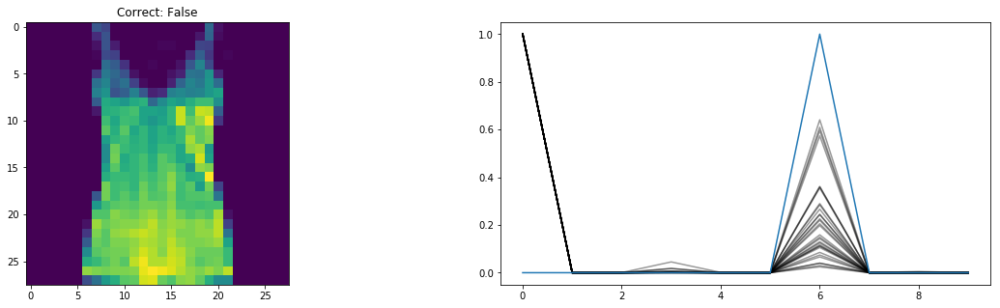

BAD PREDICTION


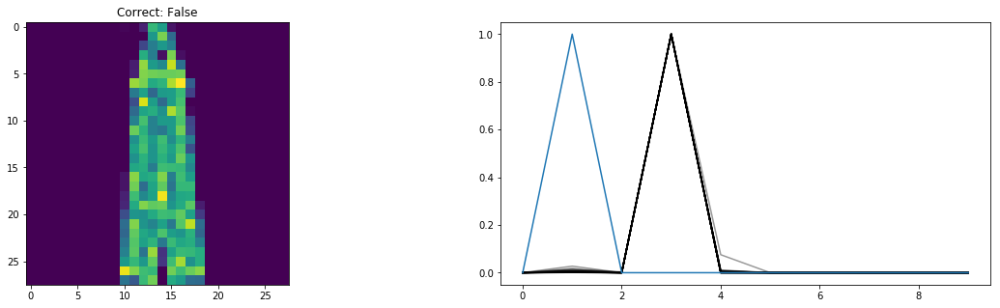

BAD PREDICTION


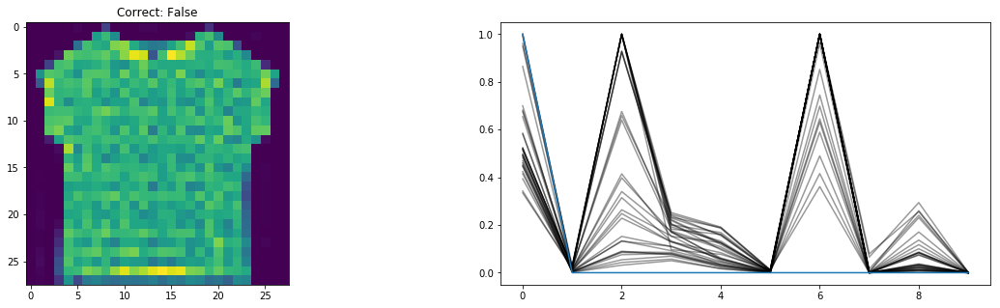

BAD PREDICTION


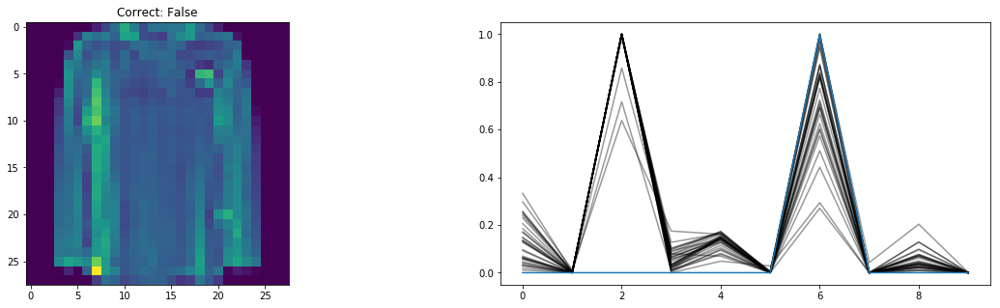

BAD PREDICTION


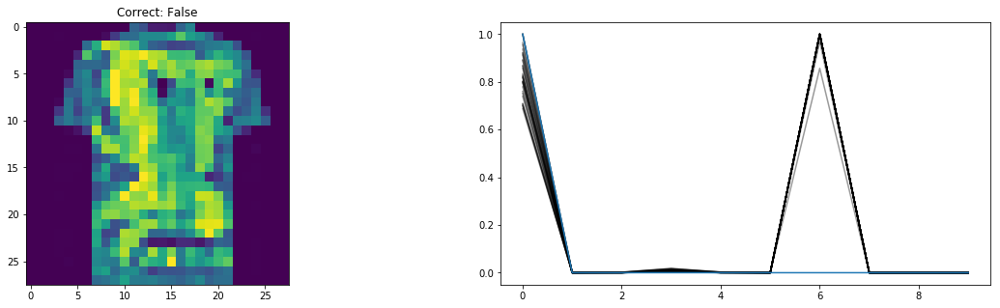

BAD PREDICTION


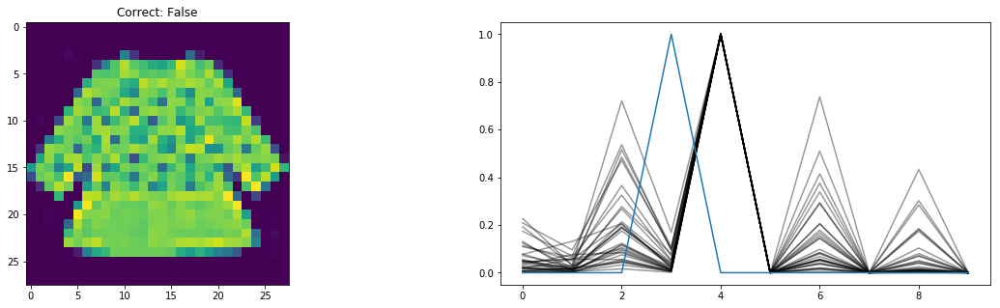

BAD PREDICTION


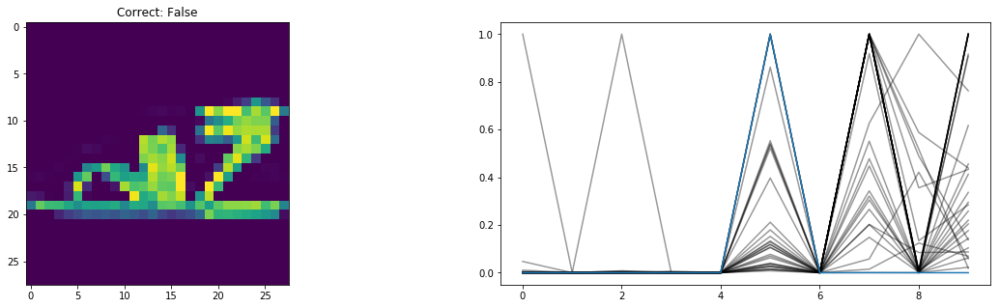

BAD PREDICTION


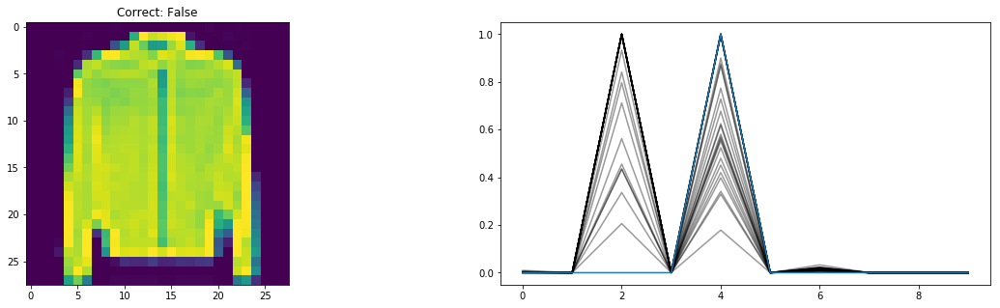

BAD PREDICTION


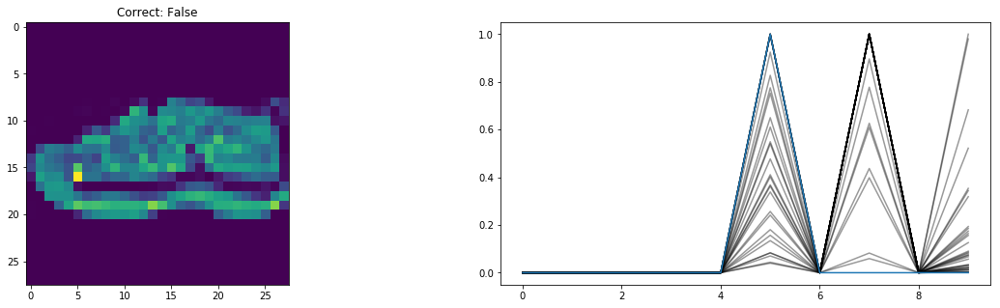

BAD PREDICTION


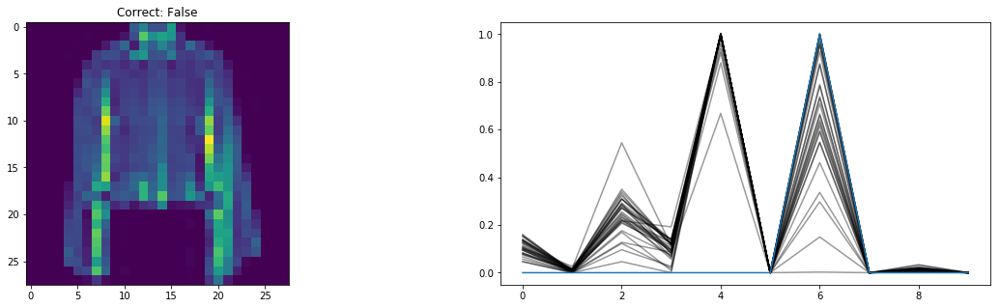

BAD PREDICTION


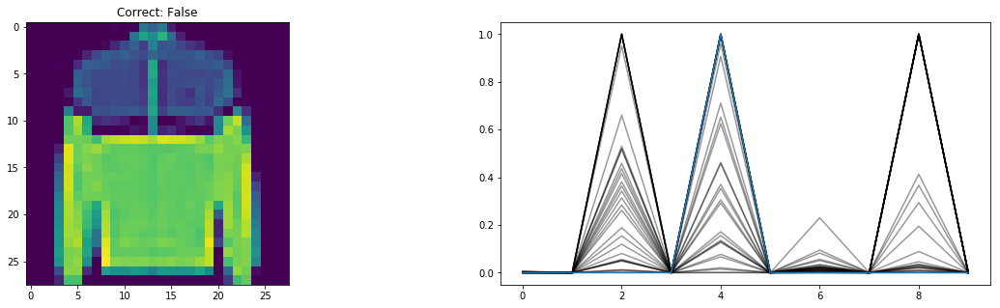

BAD PREDICTION


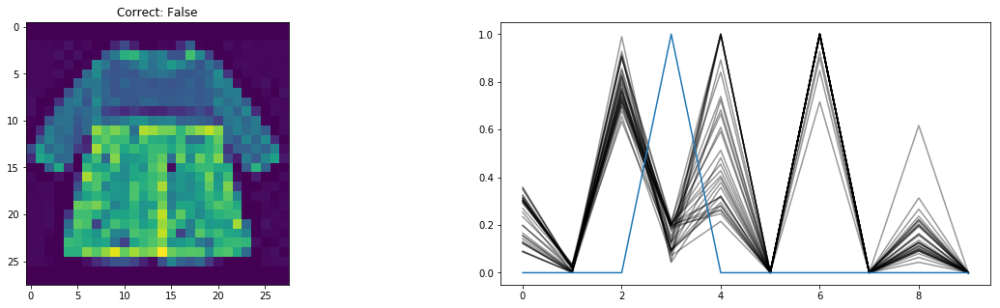

BAD PREDICTION


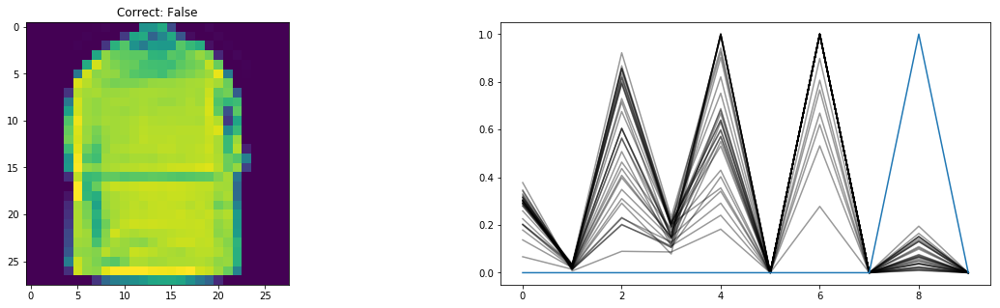

BAD PREDICTION


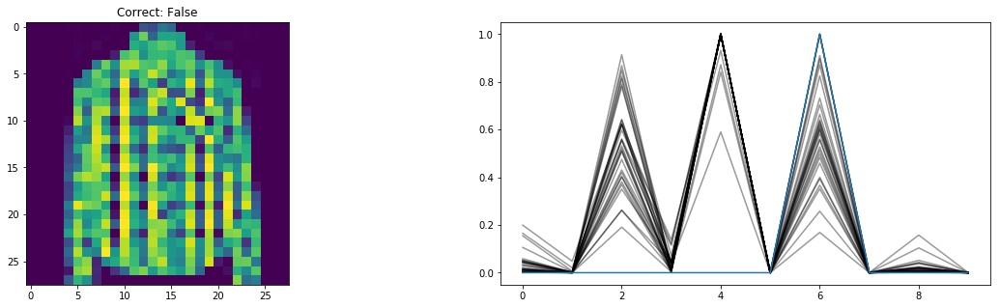

BAD PREDICTION


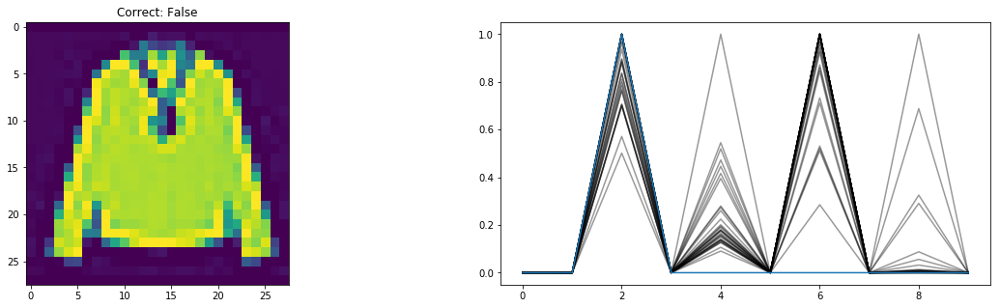

BAD PREDICTION


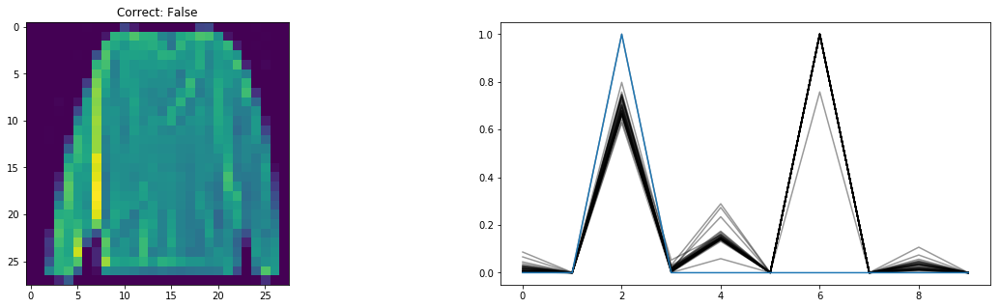

BAD PREDICTION


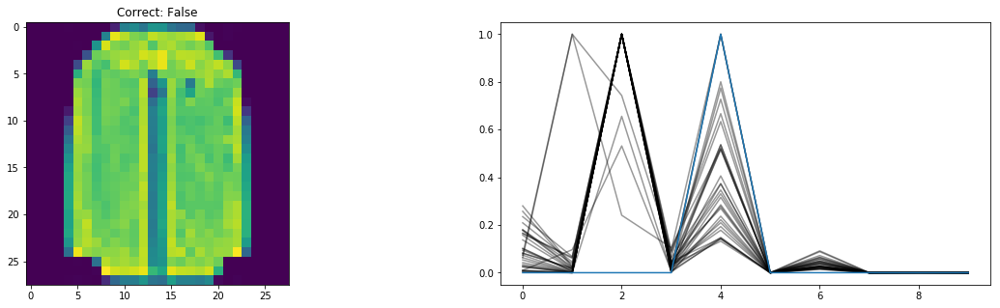

BAD PREDICTION


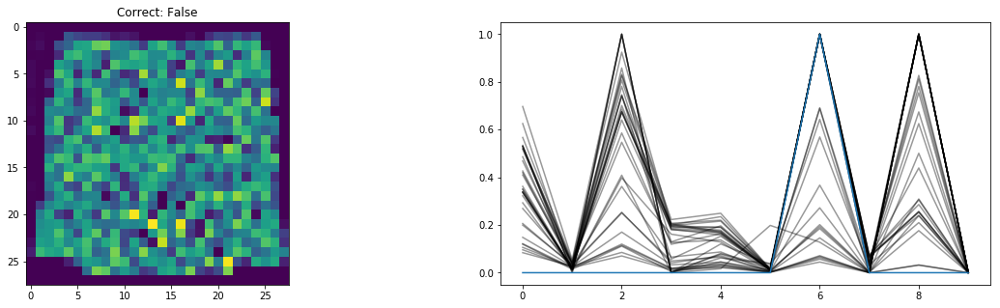

BAD PREDICTION


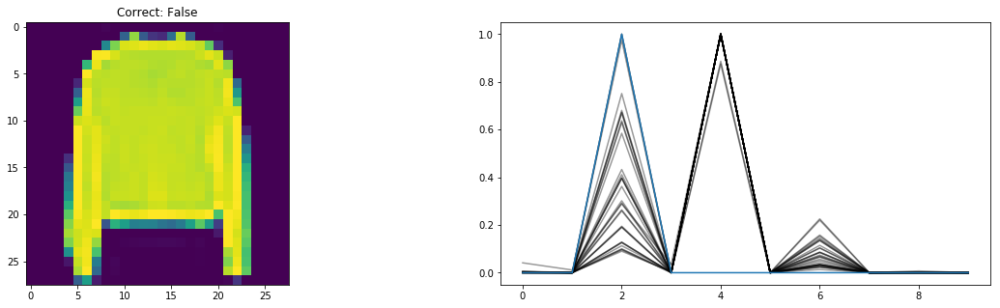

BAD PREDICTION


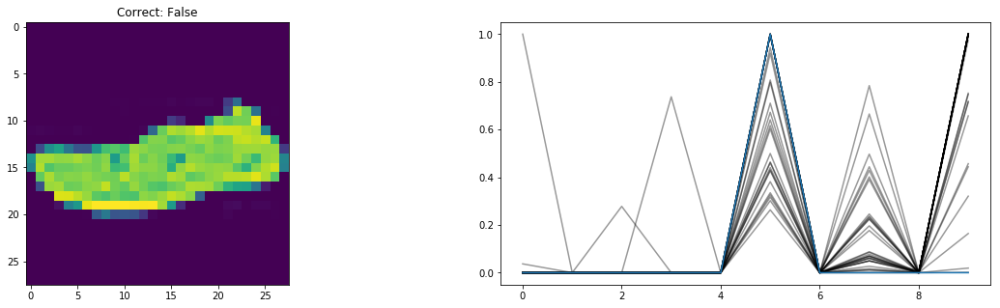

BAD PREDICTION


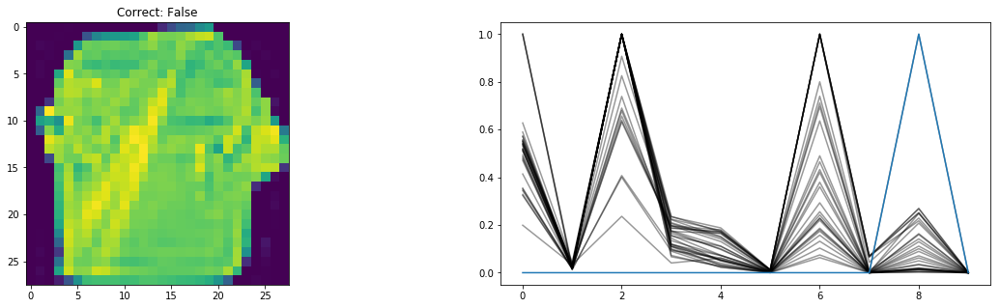

BAD PREDICTION


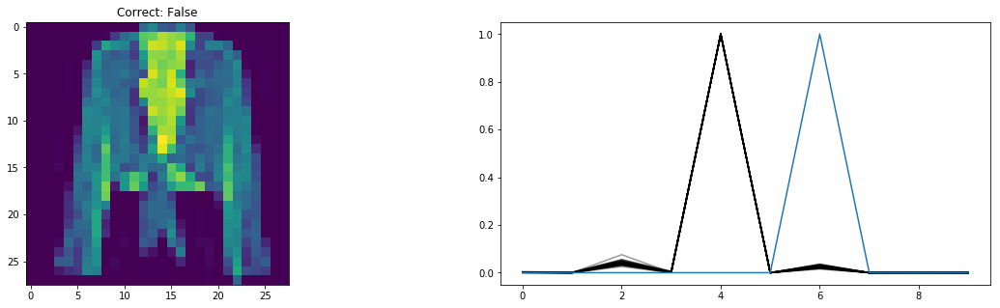

BAD PREDICTION


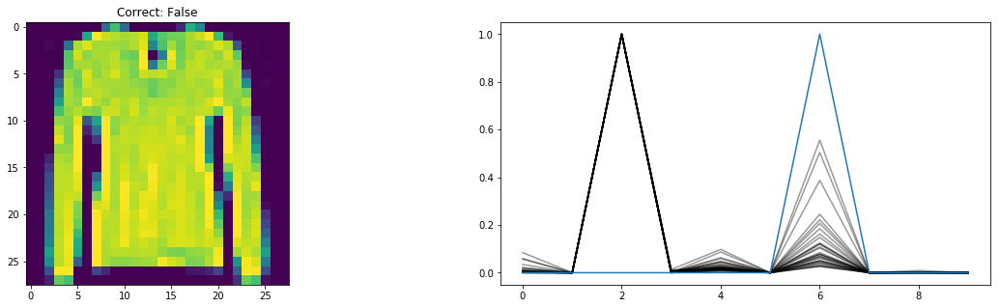

BAD PREDICTION


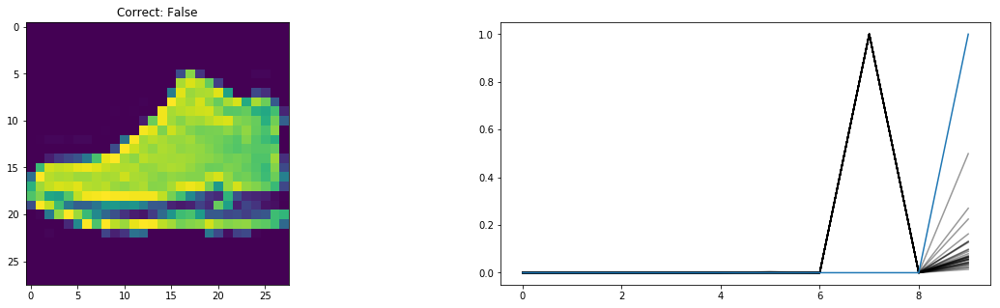

BAD PREDICTION


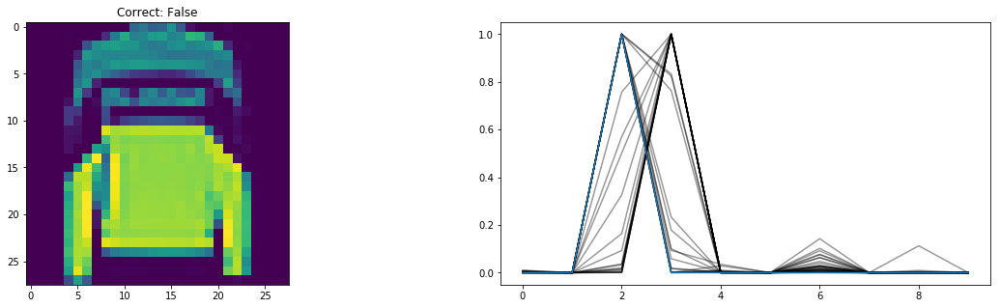

BAD PREDICTION


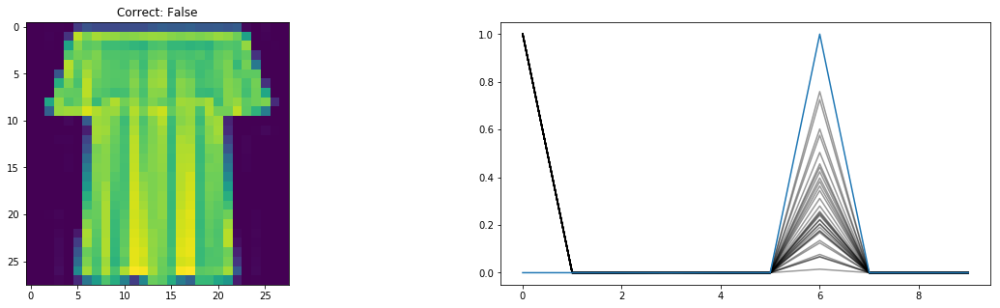

BAD PREDICTION


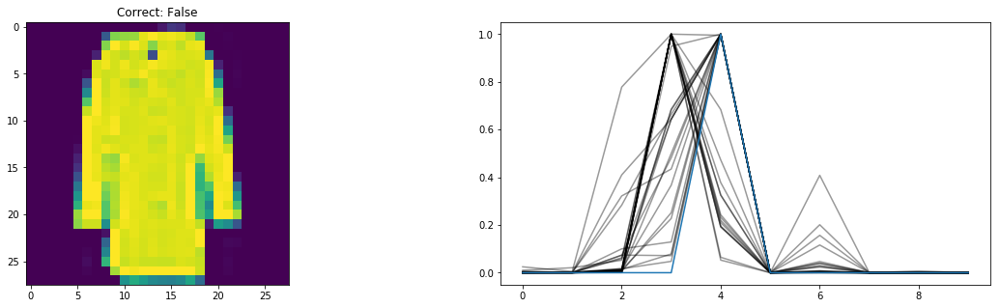

BAD PREDICTION


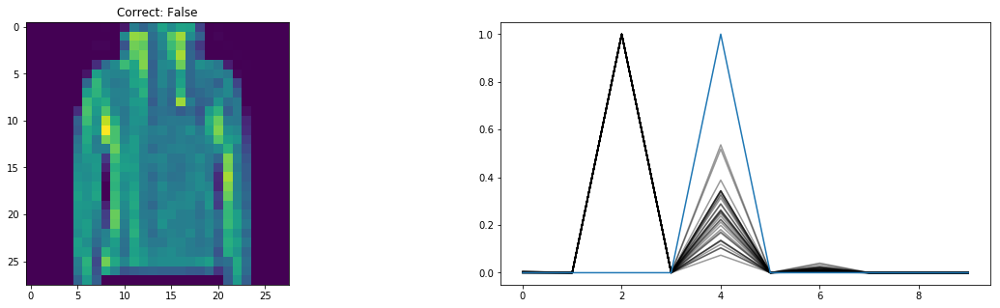

BAD PREDICTION


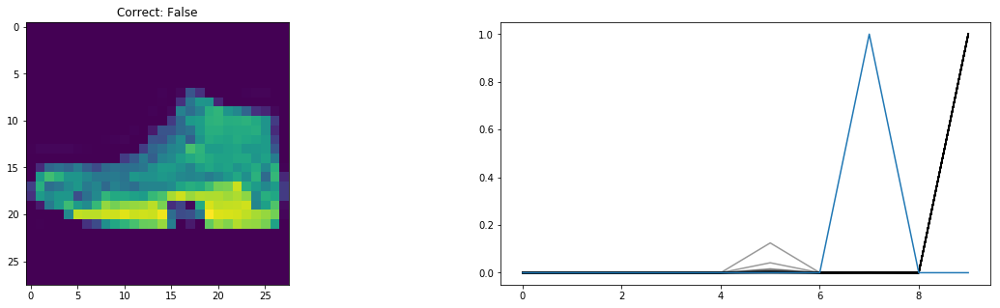

BAD PREDICTION


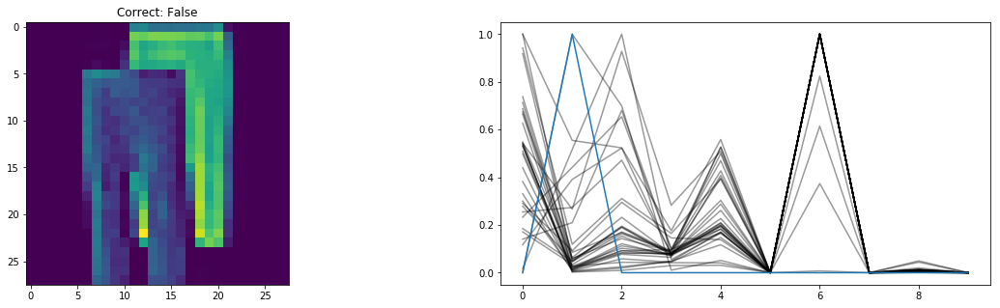

BAD PREDICTION


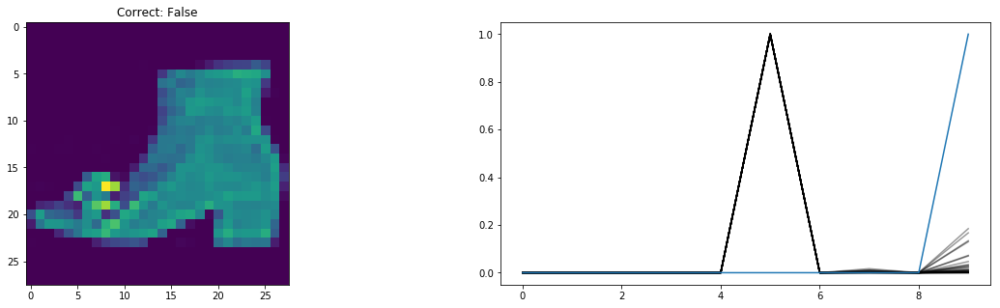

BAD PREDICTION


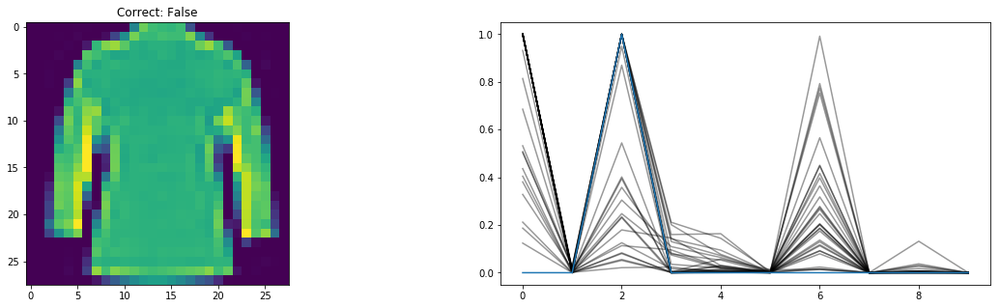

BAD PREDICTION


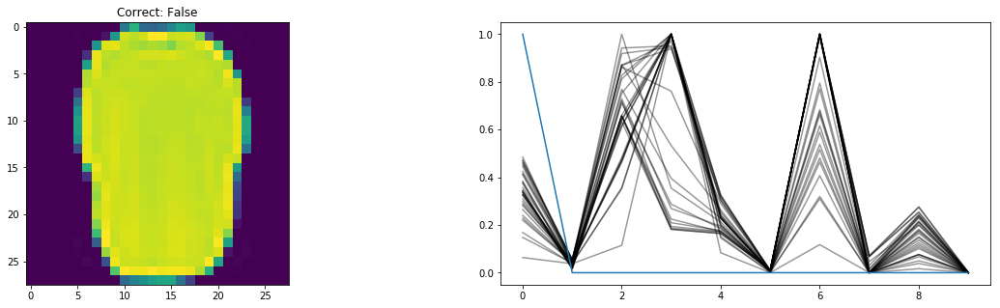

BAD PREDICTION


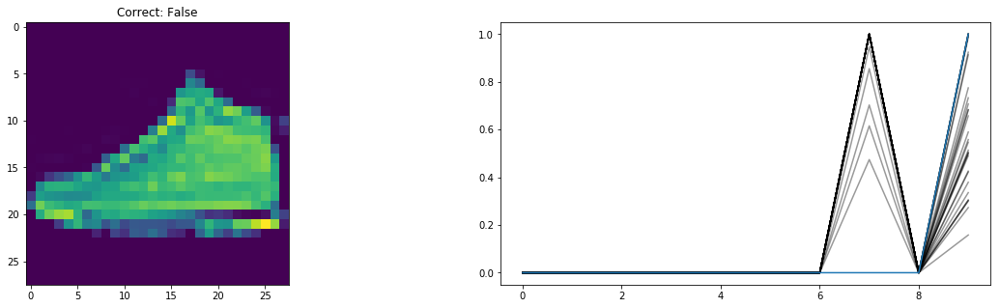

BAD PREDICTION


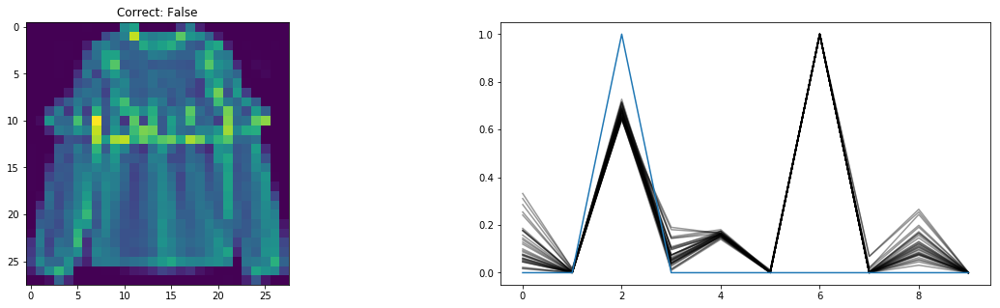

BAD PREDICTION


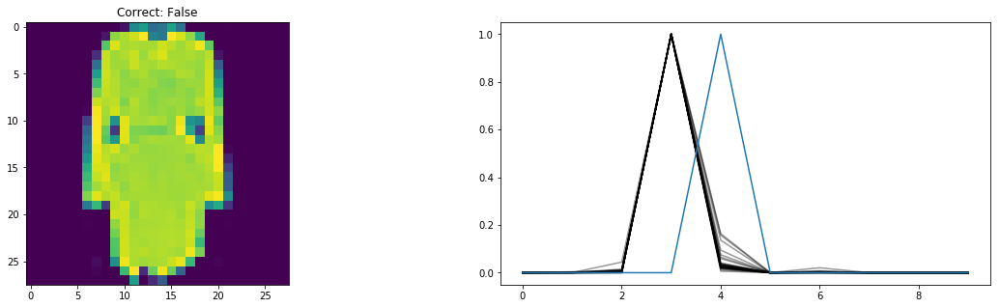

BAD PREDICTION


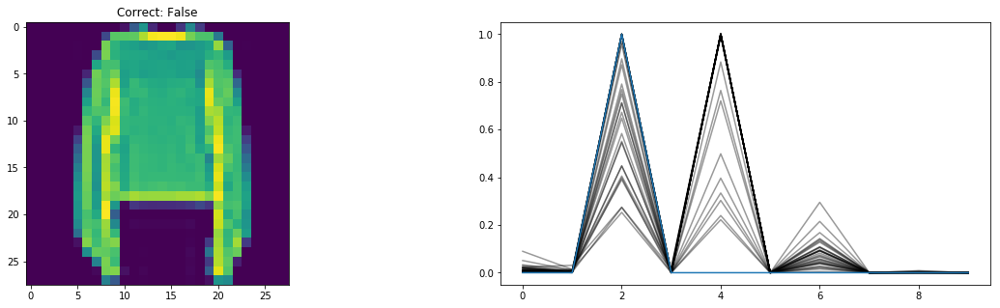

BAD PREDICTION


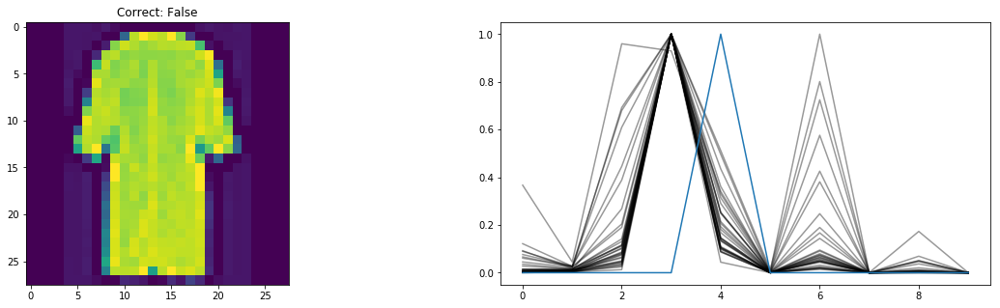

BAD PREDICTION


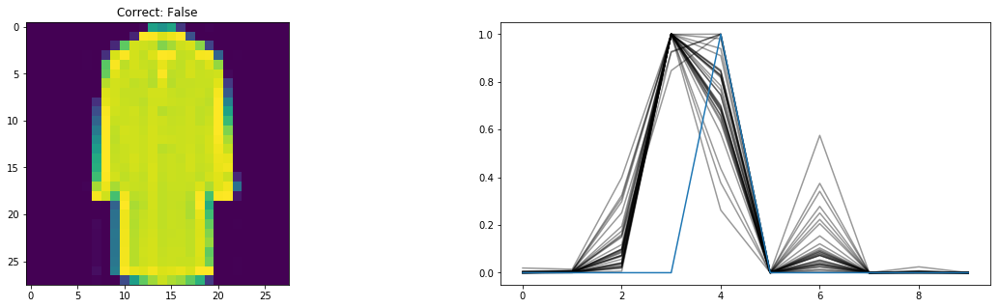

BAD PREDICTION


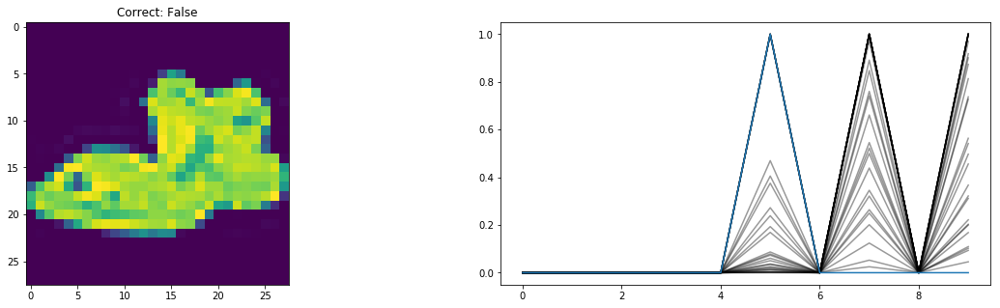

BAD PREDICTION


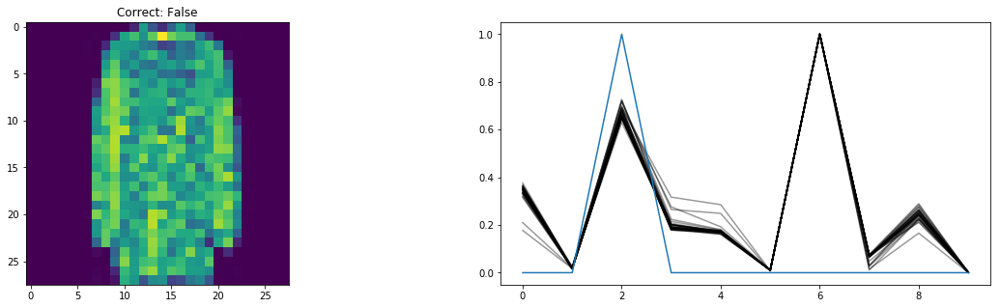

BAD PREDICTION


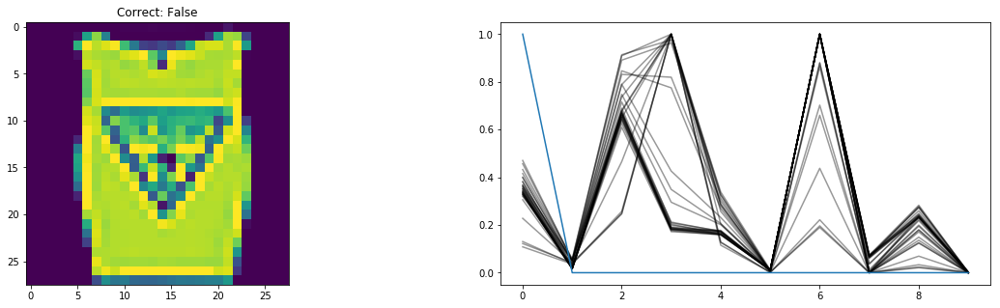

BAD PREDICTION


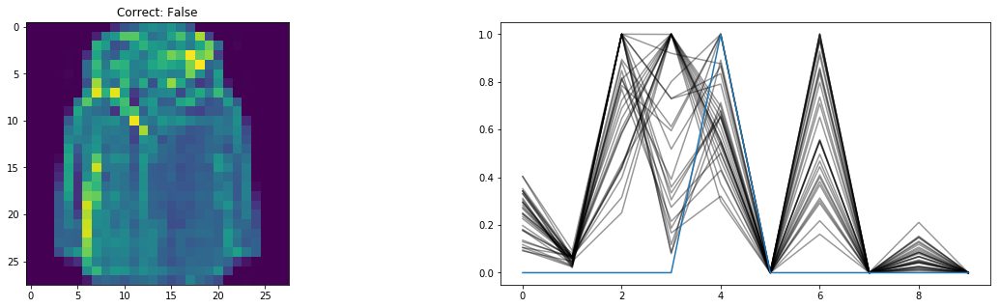

BAD PREDICTION


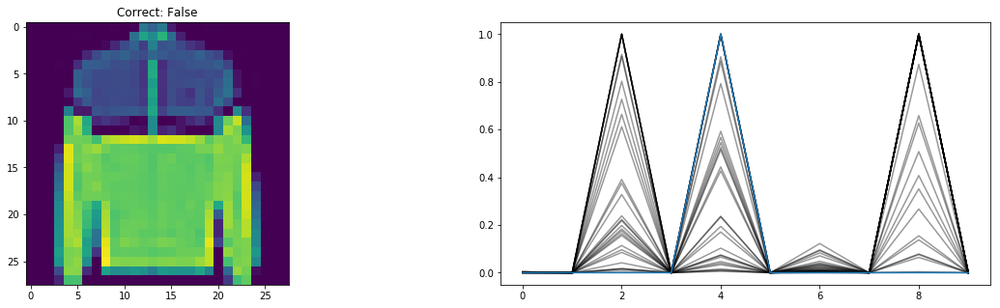

BAD PREDICTION


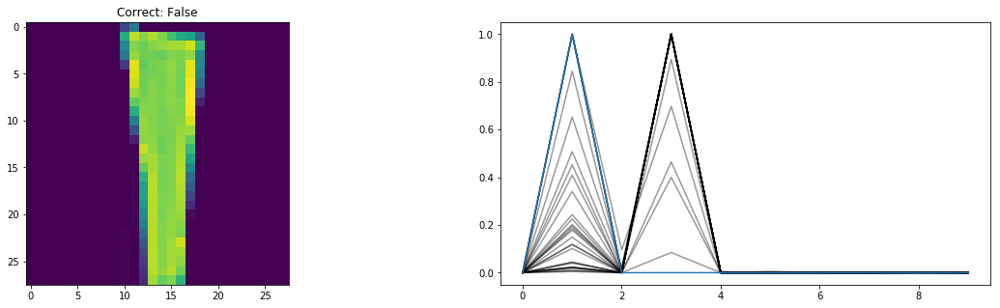

BAD PREDICTION


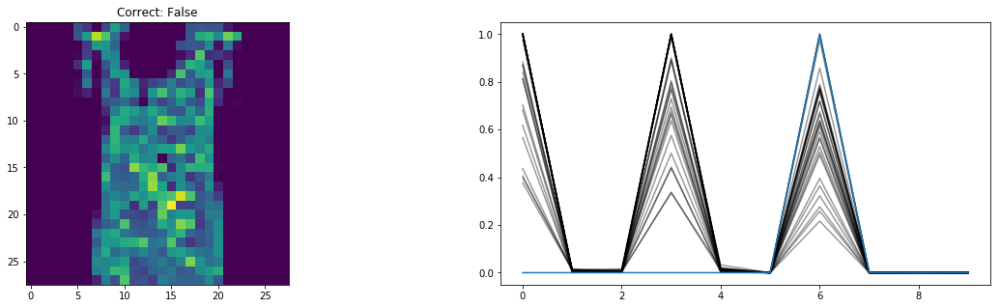

BAD PREDICTION


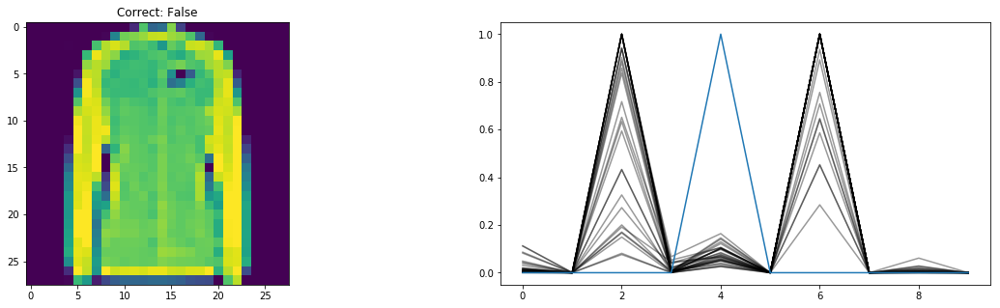

BAD PREDICTION


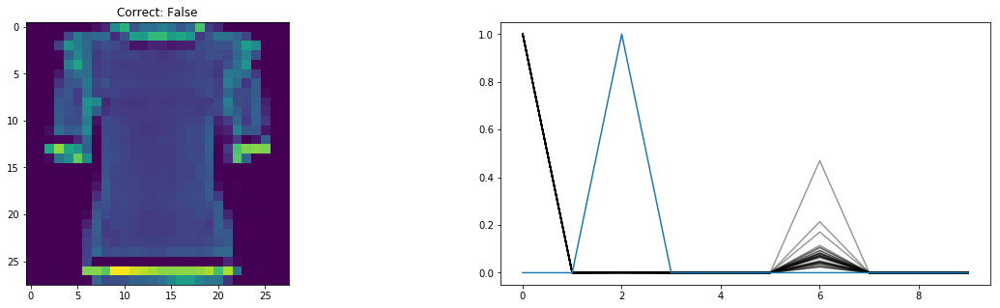

BAD PREDICTION


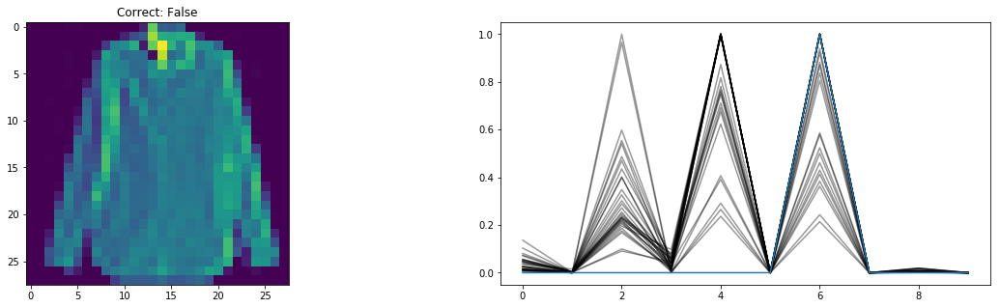

In [33]:
it = 0
total_it = 0
max_it = 50
while it < max_it:
    total_it += 1
    result = plot_predictions(
        sess,
        output_tensor=qx,
        x_input=x_input,
        mnist=fmnist,
        only_incorrect = True,
    )
    it += int(not result)

In [34]:
it, total_it, 1-it/total_it

(50, 381, 0.868766404199475)

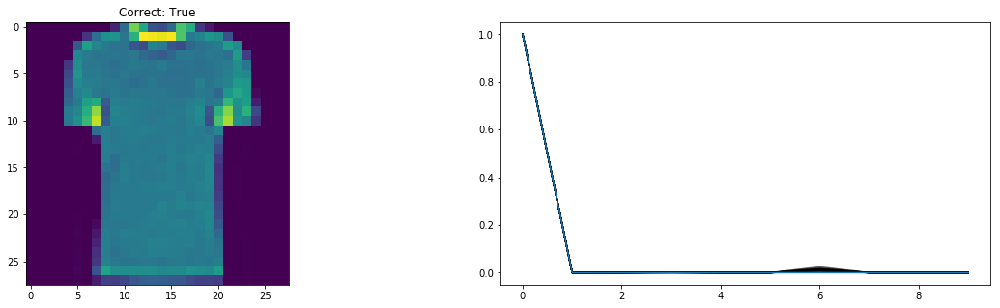

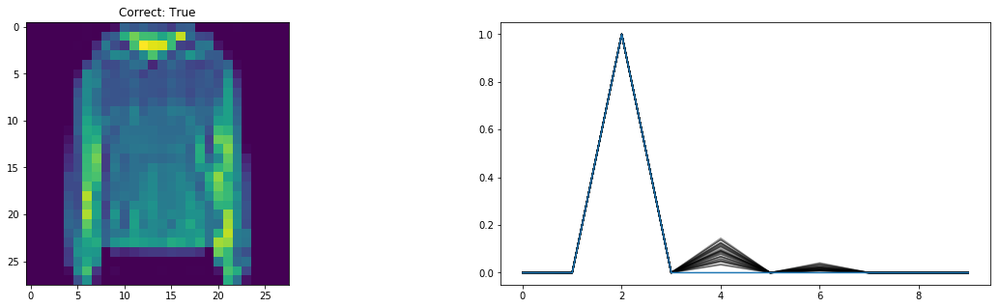

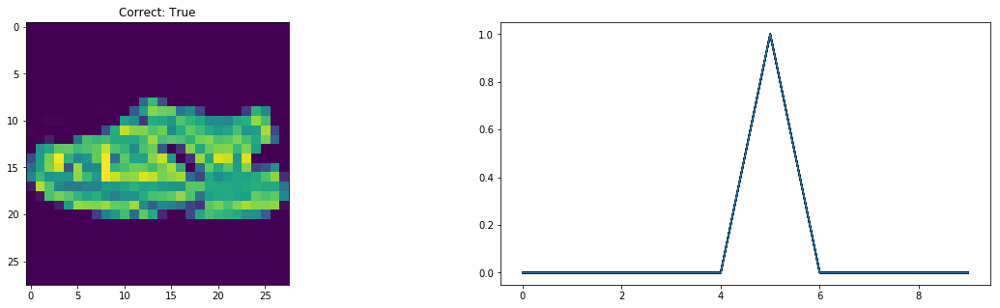

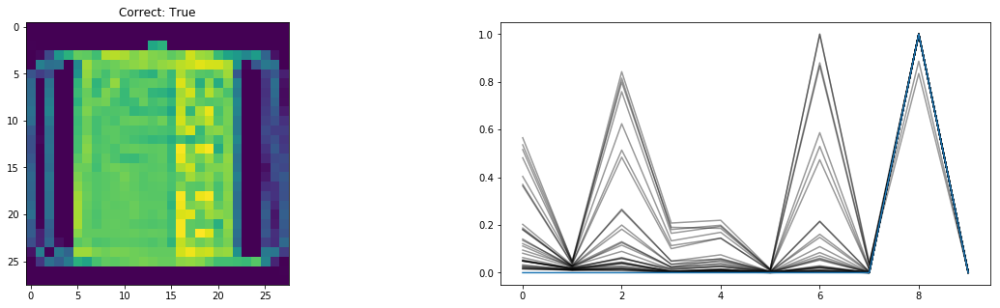

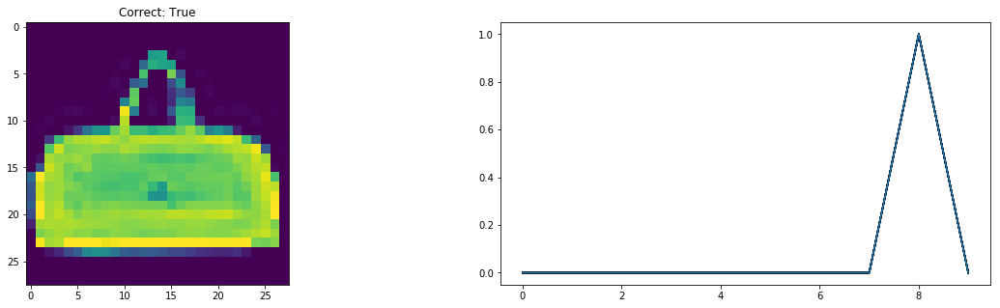

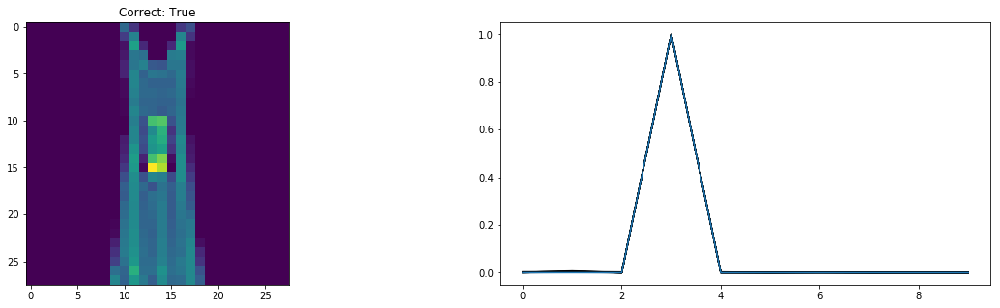

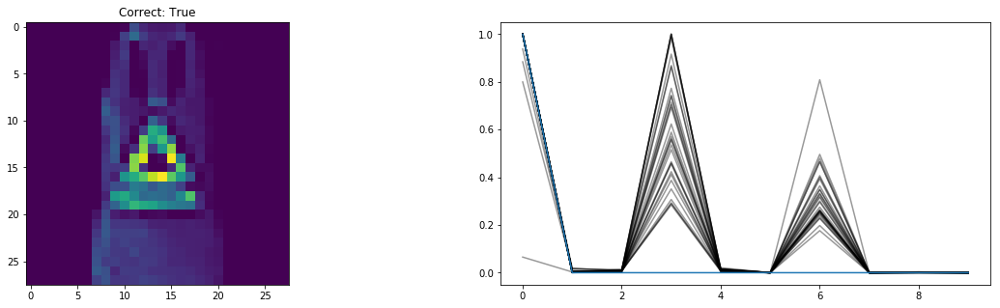

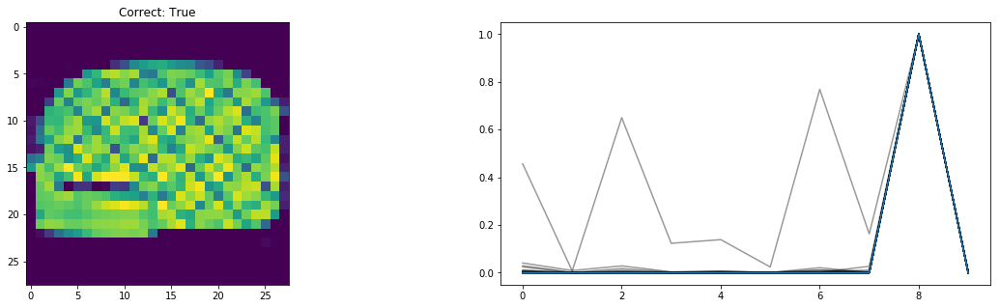

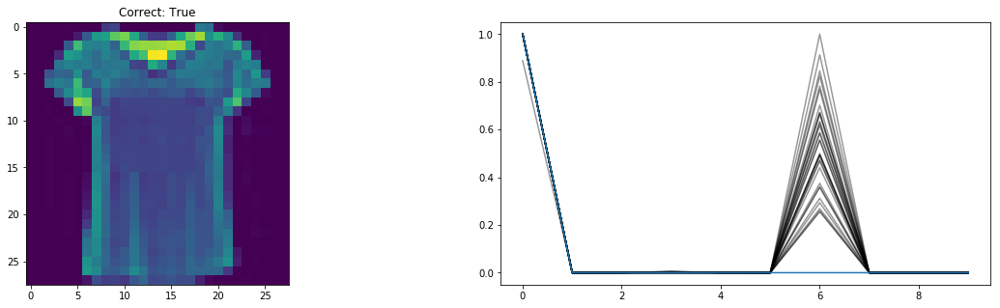

BAD PREDICTION


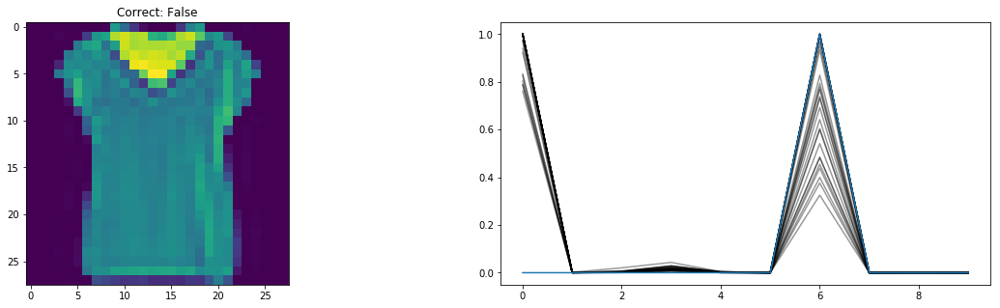

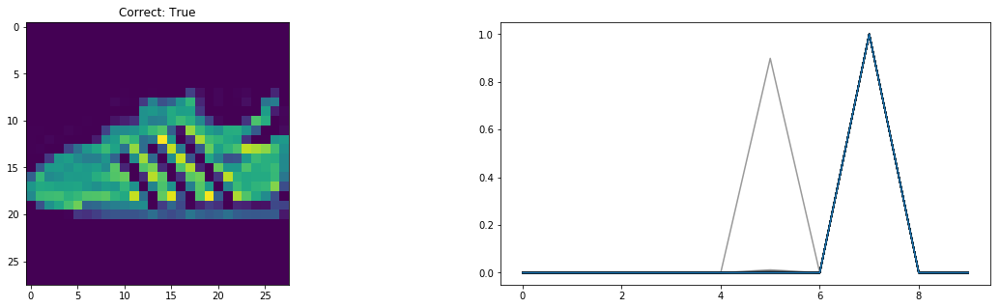

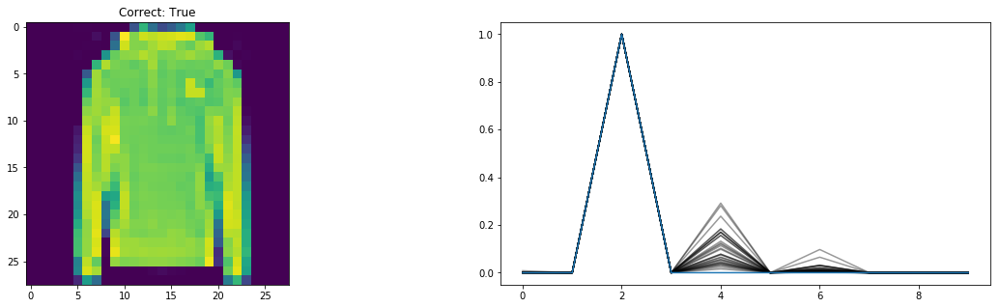

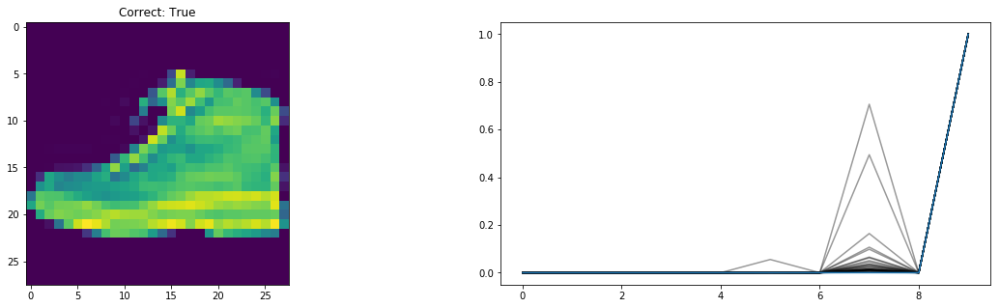

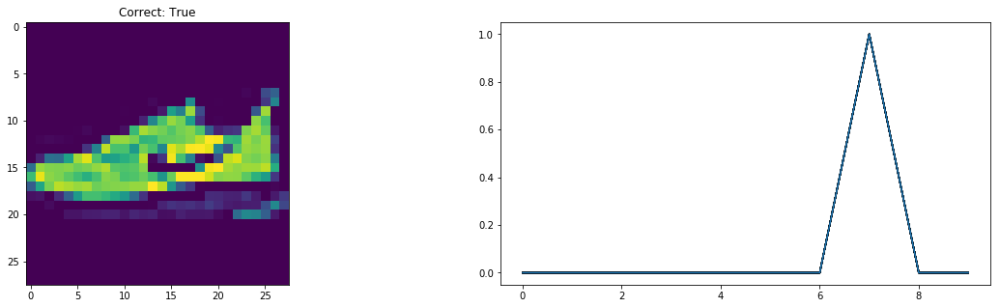

...

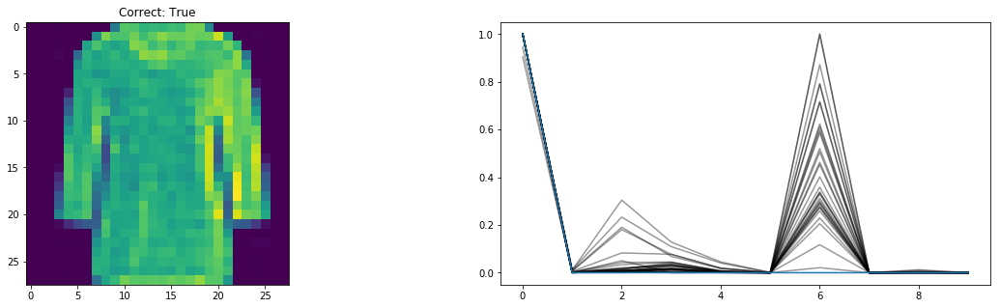

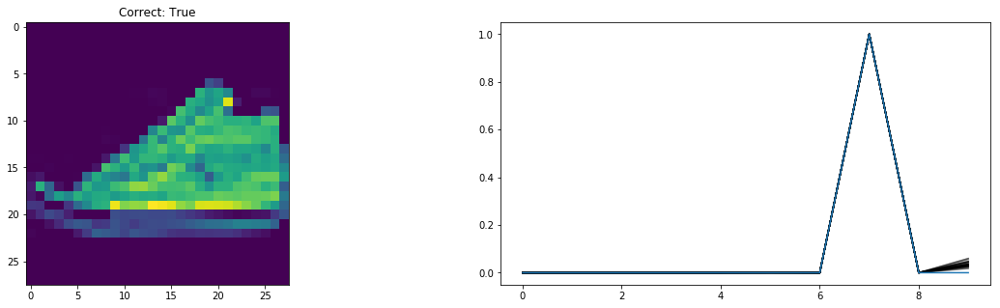

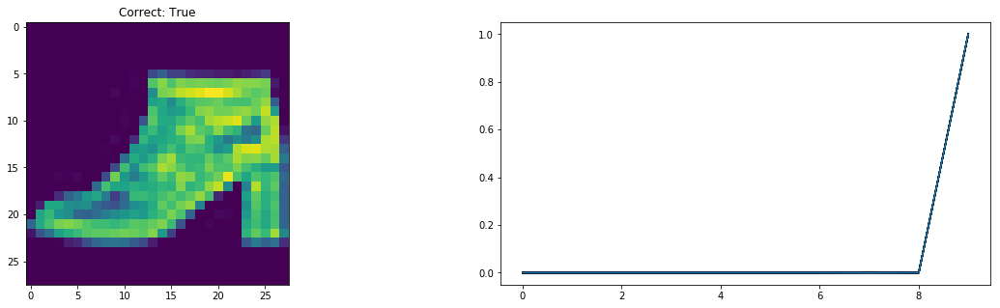

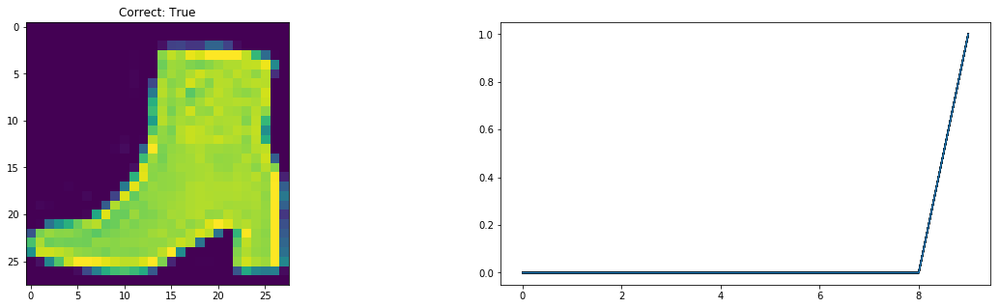

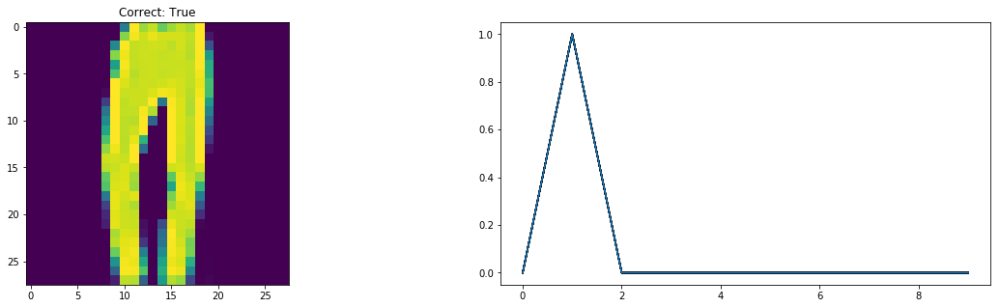

BAD PREDICTION


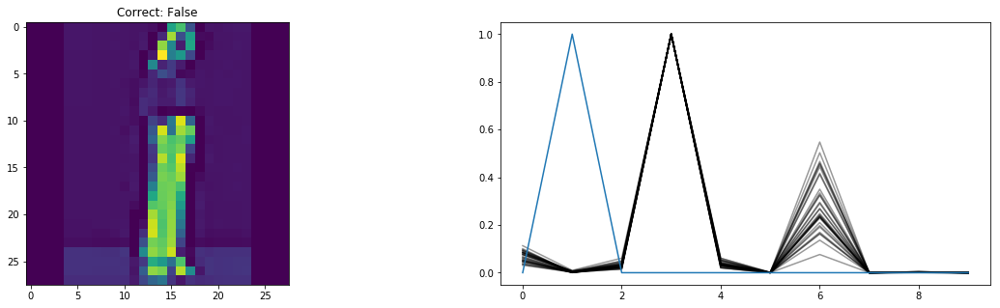

BAD PREDICTION


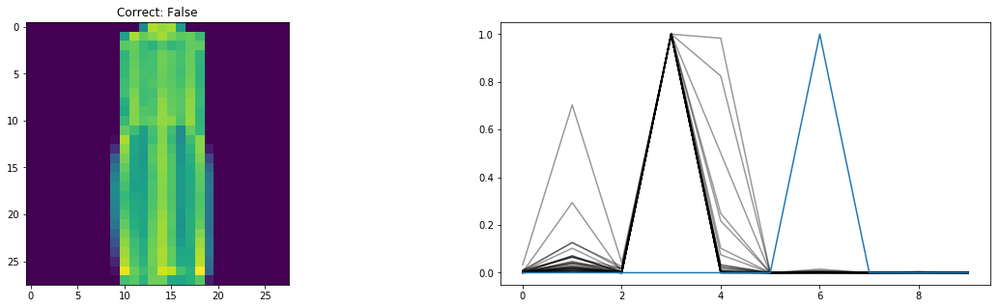

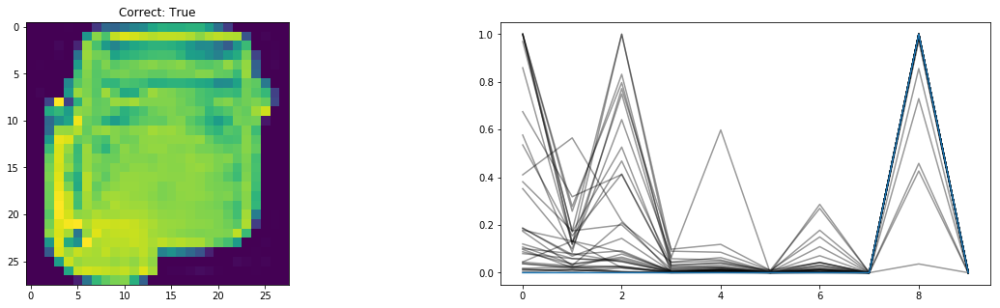

In [31]:
it = 0
max_it = 20
while it < max_it:
    total_it += 1
    result = plot_predictions(
        sess,
        output_tensor=qx,
        x_input=x_input,
        mnist=fmnist,
        only_incorrect = False,
    )
    it += int(result)

# Training bayesian CNN

In [35]:
sess = tf.InteractiveSession()

## Define network

In [37]:
from tensorflow.contrib.slim import arg_scope
from utils.layers import bayesian_dense, bayesian_conv2d, conv2d, bayesian_categorical
from utils.edward_utils import get_edward_data

tf.reset_default_graph()
sess = tf.InteractiveSession()

N = 64   # number of images in a minibatch.
num_classes = 10    # number of classes.

net_params = {}

x_input = tf.placeholder(tf.float32, [None, 28, 28, 1])
y_label = tf.placeholder(tf.int32, [N])
training_mode = tf.placeholder(tf.bool)

# Feature Extractors
with tf.name_scope("conv_block1"):
    with arg_scope([conv2d], filters=16, kernel_size=3, dropout=0.2, training=training_mode):
        x = conv2d(layer=x_input, name='conv11')
        x = conv2d(layer=x, name='conv21')
    x = tf.layers.max_pooling2d(x, pool_size=(2, 2), strides=(2, 2))
    print(x)
    
with tf.name_scope("conv_block2"):
    with arg_scope([conv2d], filters=32, kernel_size=3, dropout=0.2, training=training_mode):
        x = conv2d(layer=x, name='conv12')
        x = conv2d(layer=x, name='conv22')
    x = tf.layers.max_pooling2d(x, pool_size=(2, 2), strides=(2, 2))    
    print(x)


with tf.name_scope("bayes_block1"):
    # convolutions
    x, qx, net_params['bayes_conv1'] = bayesian_conv2d(
        x, x, filters=64, kernel_size=3, kl_scaling=0.4, name='bconv1')
    
    x, qx, net_params['bayes_conv2'] = bayesian_conv2d(
        x, qx, filters=64, kernel_size=3, kl_scaling=0.4, name='bconv2')
    # pooling
    x = tf.layers.max_pooling2d(x, pool_size=(2, 2), strides=(2, 2))    
    qx = tf.layers.max_pooling2d(qx, pool_size=(2, 2), strides=(2, 2))    
    print(x)
    print(qx)

x = tf.contrib.layers.flatten(x)
qx = tf.contrib.layers.flatten(qx)
print(x)
x, qx, net_params['bayes_dense1'] = bayesian_dense(
    x, qx, 256, activation=tf.nn.relu, kl_scaling=0.3, name='bdense1')

x, qx, net_params['bayes_dense2'] = bayesian_dense(
    x, qx, num_classes, activation=tf.identity, kl_scaling=0.5, name='bdense2')

# Categorical classes
y, qy = bayesian_categorical(x, qx)

tf.global_variables_initializer().run()
# Things which we need to initialize the inference object
# in Edward
posteriors, kl_scaling = get_edward_data(net_params)

Tensor("conv_block1/max_pooling2d/MaxPool:0", shape=(?, 14, 14, 16), dtype=float32)
Tensor("conv_block2/max_pooling2d/MaxPool:0", shape=(?, 7, 7, 32), dtype=float32)
Tensor("bayes_block1/max_pooling2d/MaxPool:0", shape=(?, 3, 3, 64), dtype=float32)
Tensor("bayes_block1/max_pooling2d_1/MaxPool:0", shape=(?, 3, 3, 64), dtype=float32)
Tensor("Flatten/flatten/Reshape:0", shape=(?, 576), dtype=float32)


## Train regular model using MLE

0 8593 [None, 2.3034668, 0.140625]
2000 8593 [None, 0.28056297, 0.9375]
4000 8593 [None, 0.54306132, 0.84375]
6000 8593 [None, 0.5888828, 0.8125]
8000 8593 [None, 0.3013123, 0.890625]


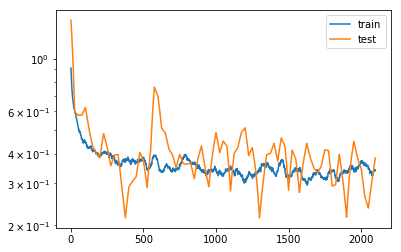

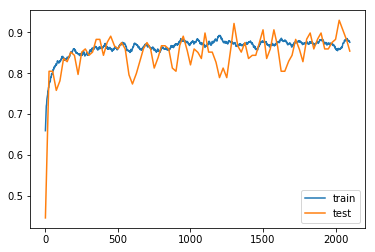

In [38]:
hist = train_mle_network(
    sess=sess, 
    qx=qx, x_input=x_input, y_label=y_label, 
    mnist=fmnist, 
    batch_size=N, 
    num_epochs=10,
    reshape=[-1, 28, 28, 1],
    feed_dict={training_mode: True}
)

## Train variational model

In [ ]:
ed_inference = train_edward_model(
        sess=sess,
        qx=qx,
        x_input=x_input, 
        y_label=y_label,
        y_pred=y,
        posteriors=posteriors,
        kl_scaling=kl_scaling,
        label_mapping={y: y_label},
        mnist=fmnist,
        batch_size=N,
        num_epochs=100,
        num_samples=10,
        reshape=[-1, 28, 28, 1],
        feed_dict={training_mode: True}
)

## Test it

In [40]:
compute_test_acc(
        sess=sess,
        output_tensor=qx,
        x_input=x_input,
        mnist=fmnist,
        reshape=[-1, 28, 28, 1],
        feed_dict={training_mode: False}
)

0.84394999999999998

BAD PREDICTION


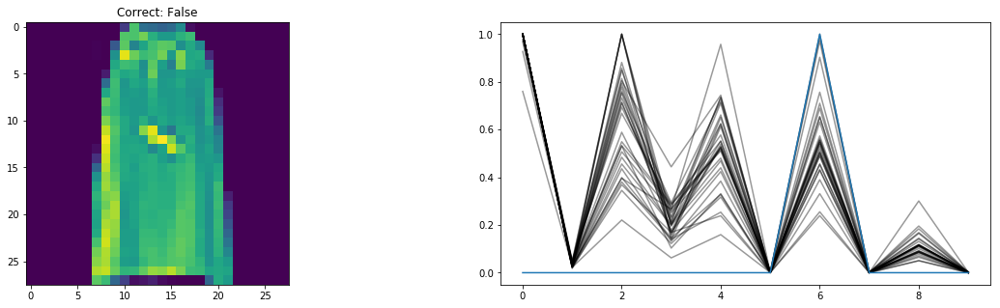

BAD PREDICTION


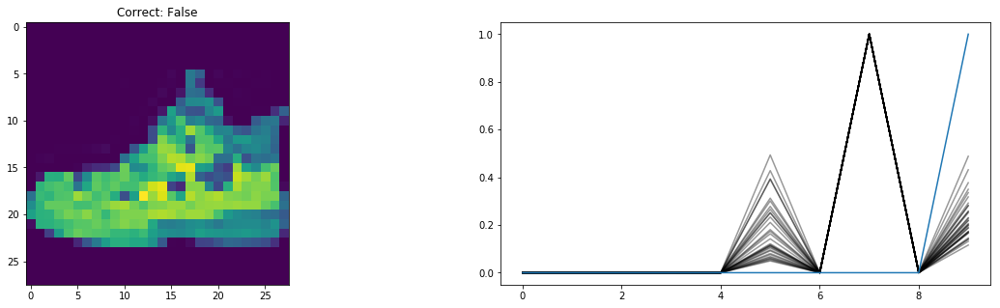

BAD PREDICTION


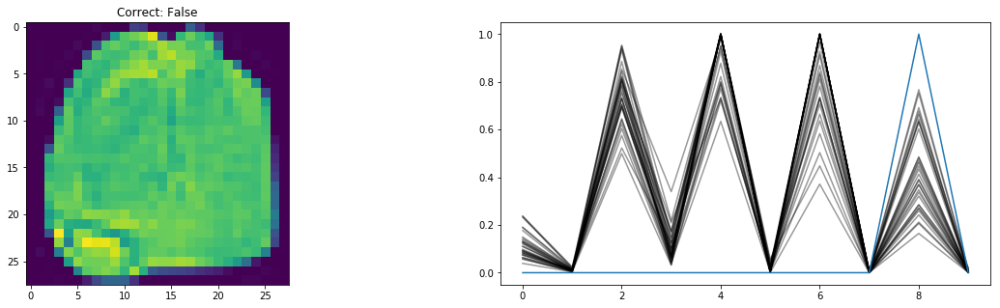

BAD PREDICTION


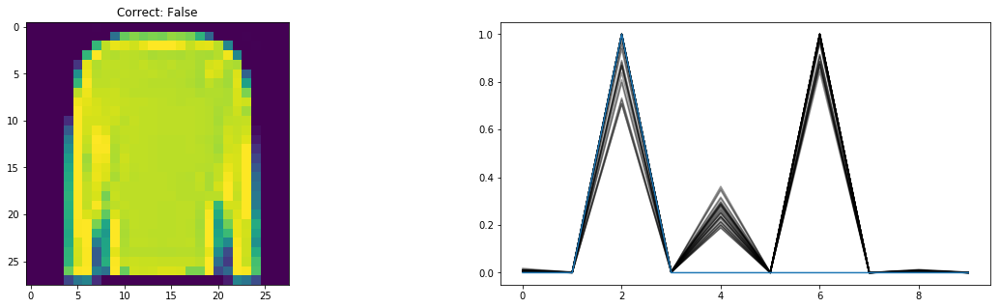

BAD PREDICTION


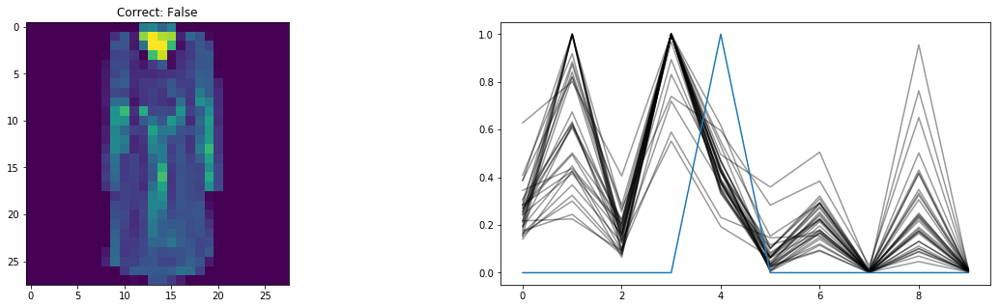

BAD PREDICTION


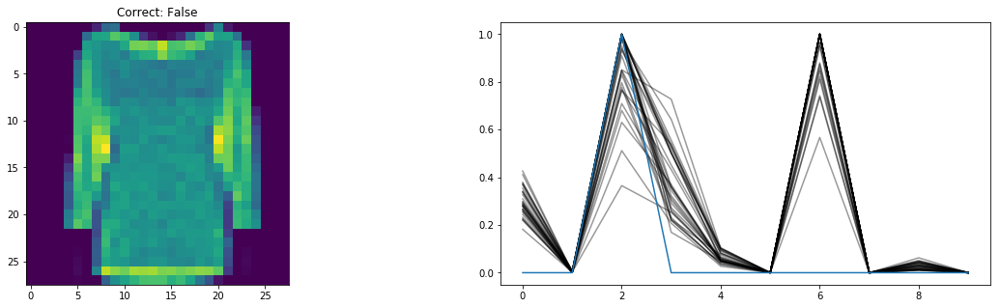

BAD PREDICTION


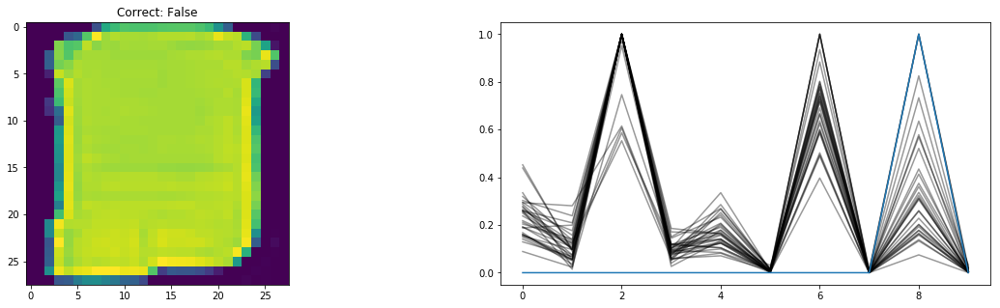

BAD PREDICTION


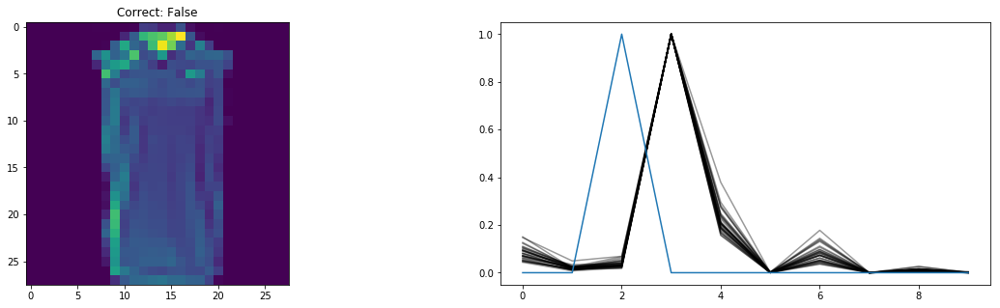

BAD PREDICTION


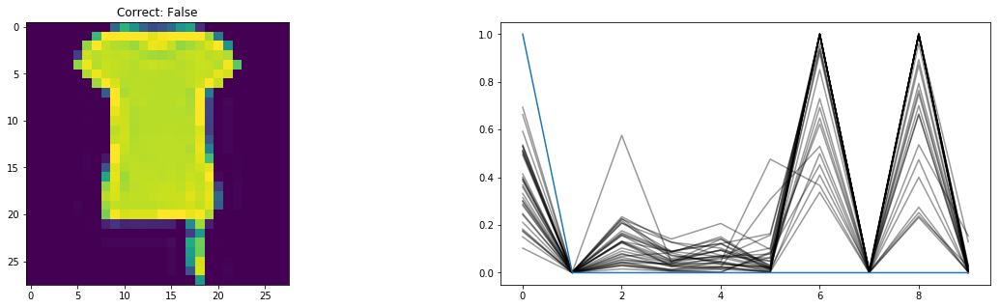

BAD PREDICTION


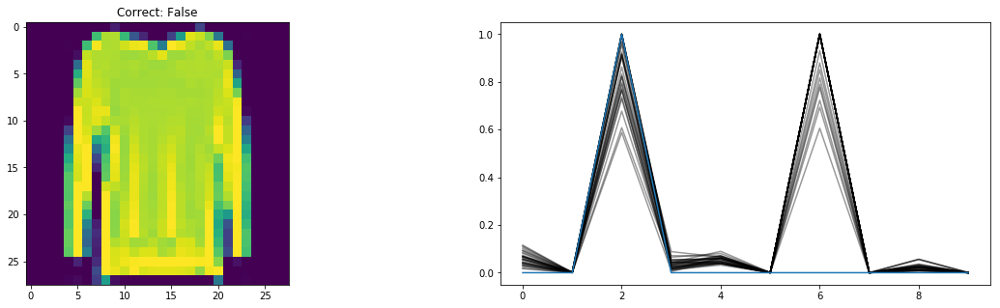

BAD PREDICTION


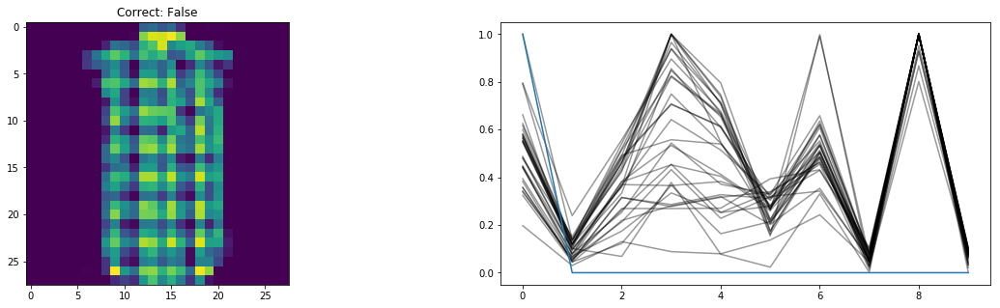

BAD PREDICTION


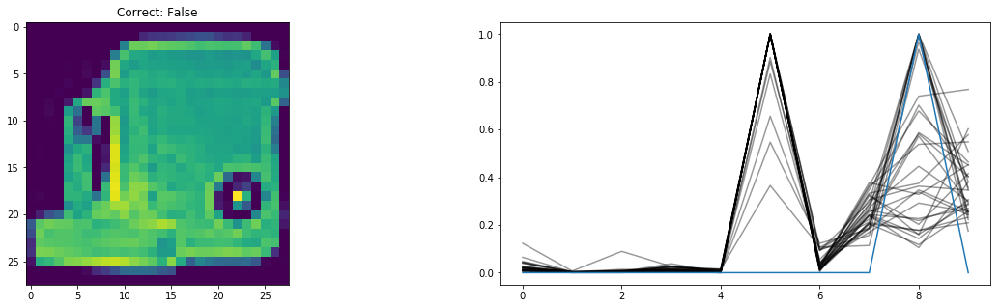

BAD PREDICTION


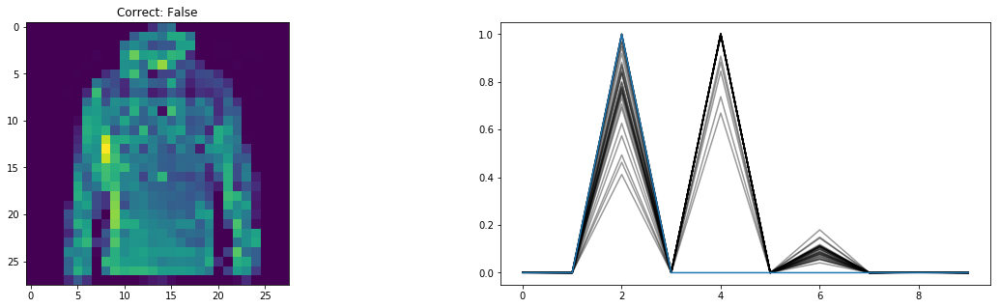

BAD PREDICTION


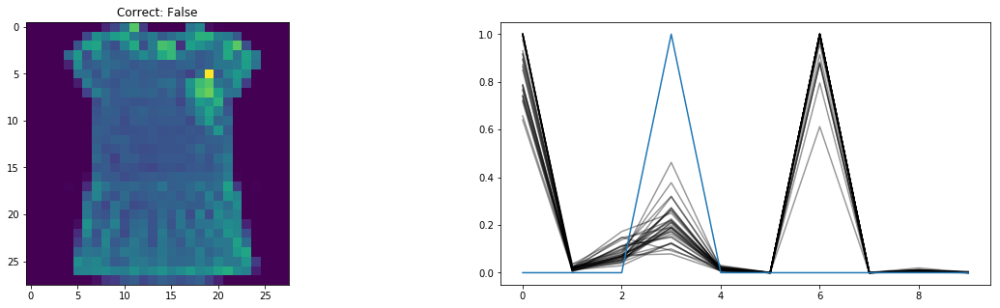

BAD PREDICTION


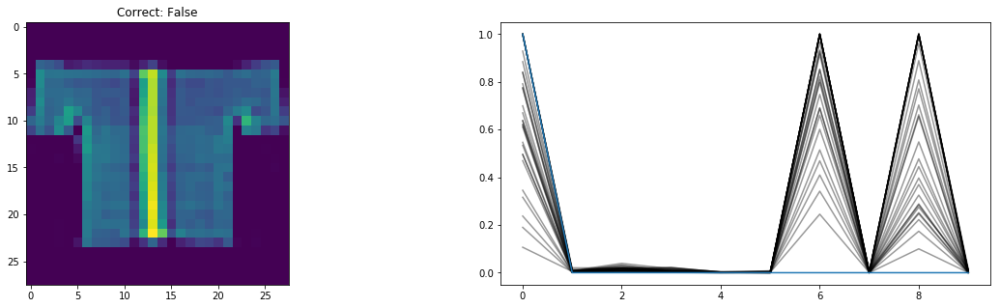

BAD PREDICTION


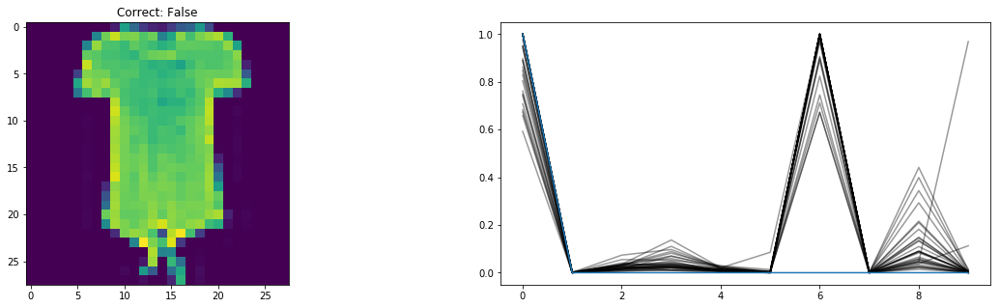

BAD PREDICTION


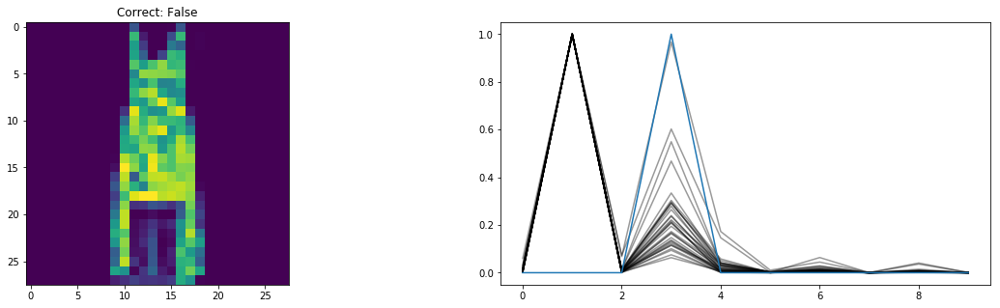

BAD PREDICTION


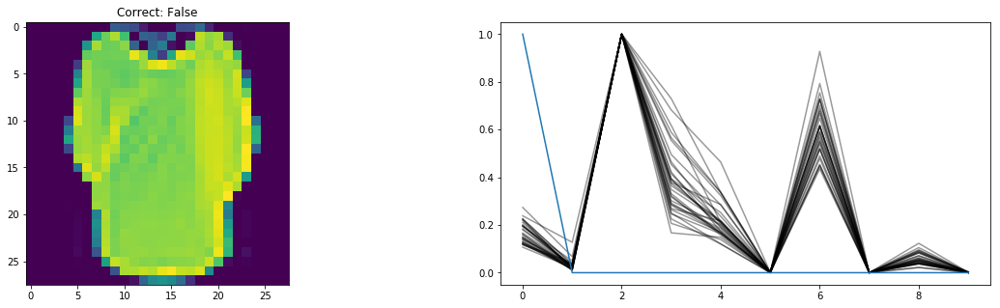

BAD PREDICTION


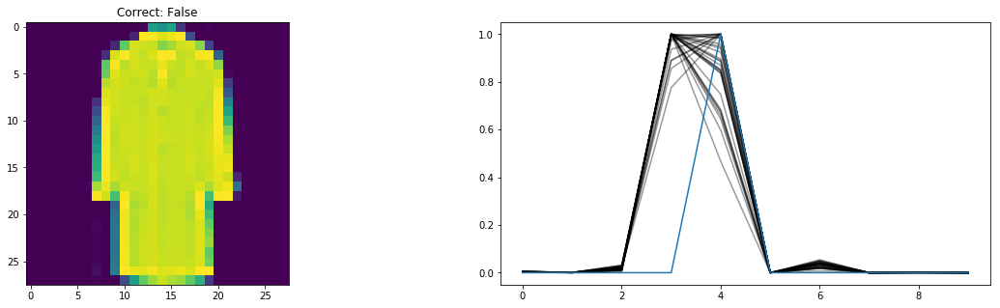

BAD PREDICTION


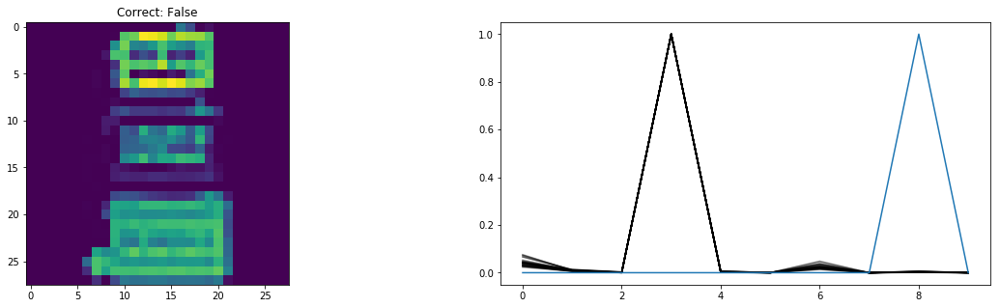

BAD PREDICTION


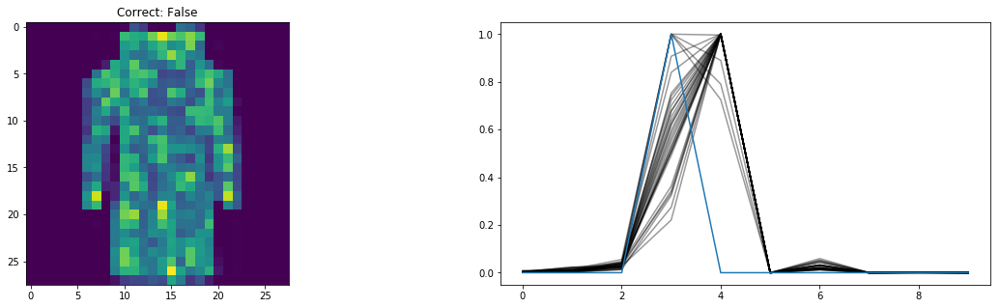

BAD PREDICTION


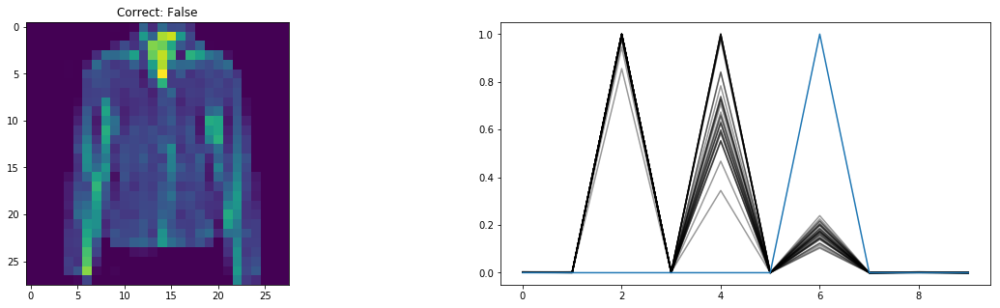

BAD PREDICTION


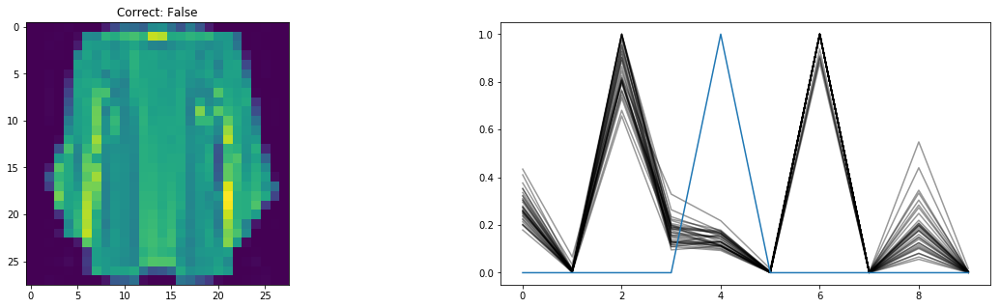

BAD PREDICTION


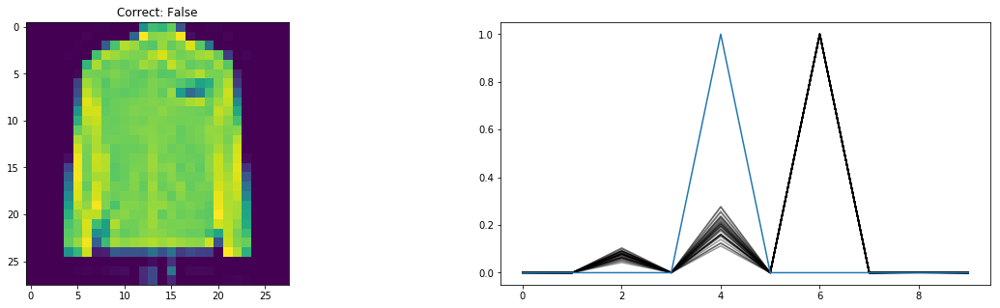

BAD PREDICTION


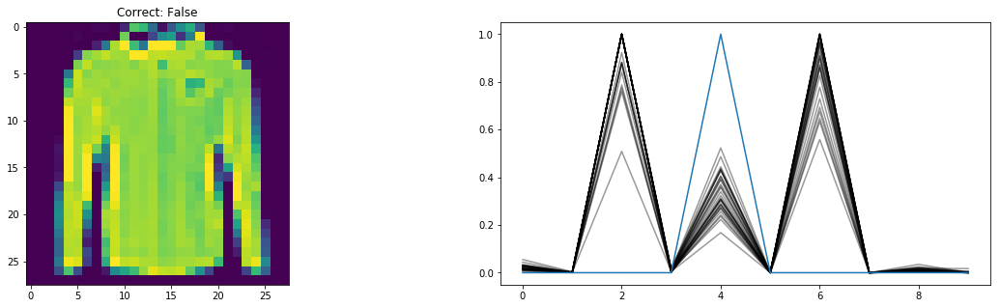

BAD PREDICTION


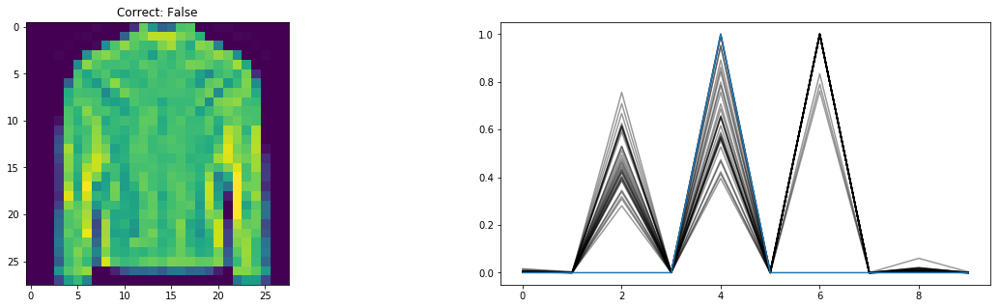

BAD PREDICTION


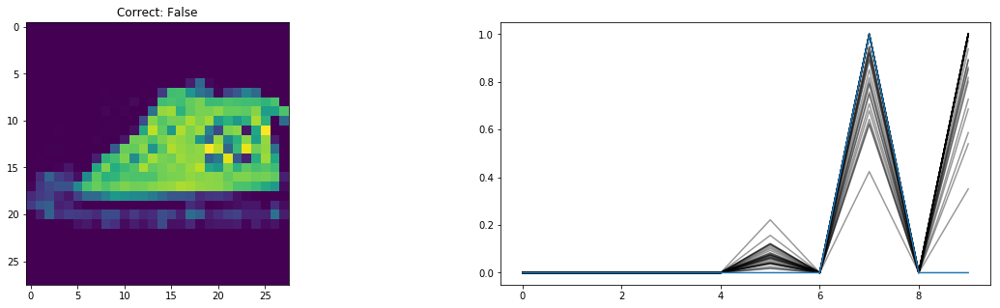

BAD PREDICTION


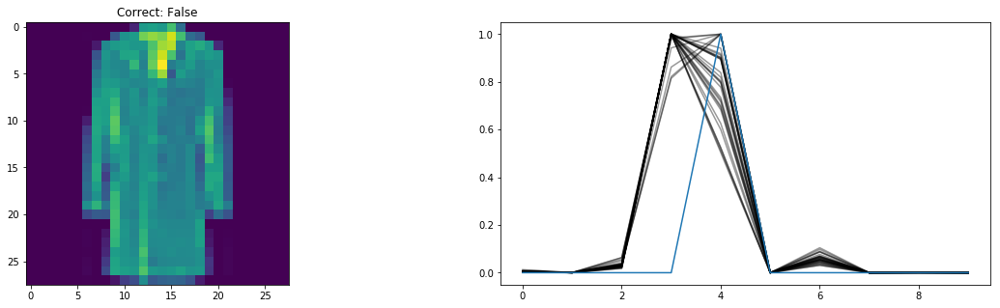

BAD PREDICTION


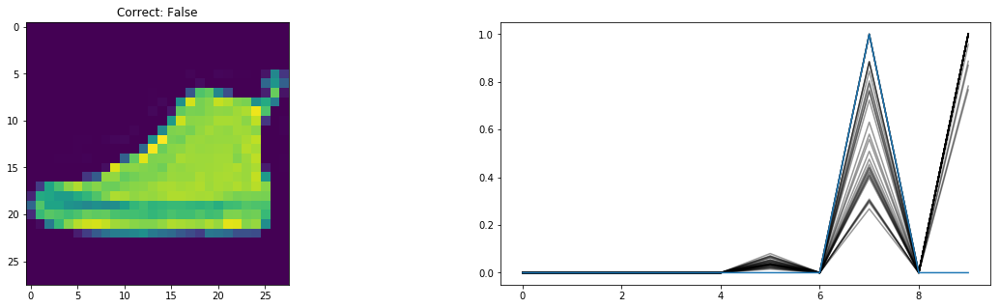

BAD PREDICTION


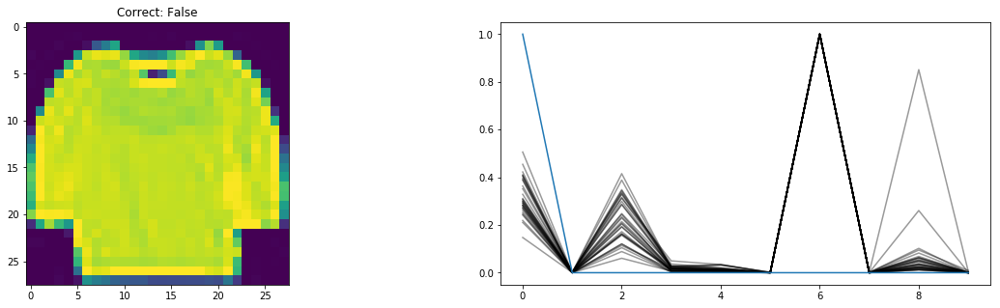

BAD PREDICTION


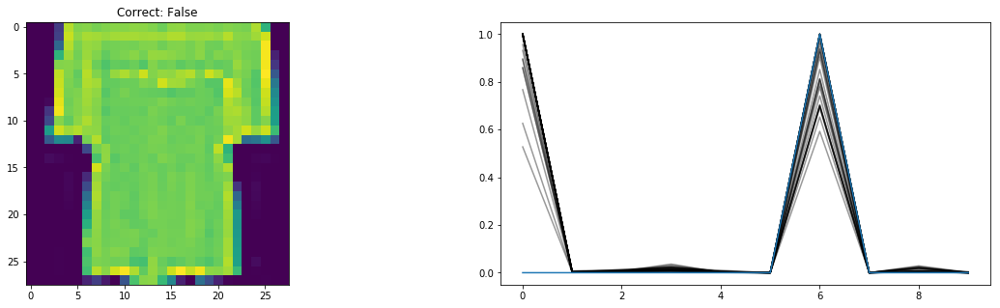

BAD PREDICTION


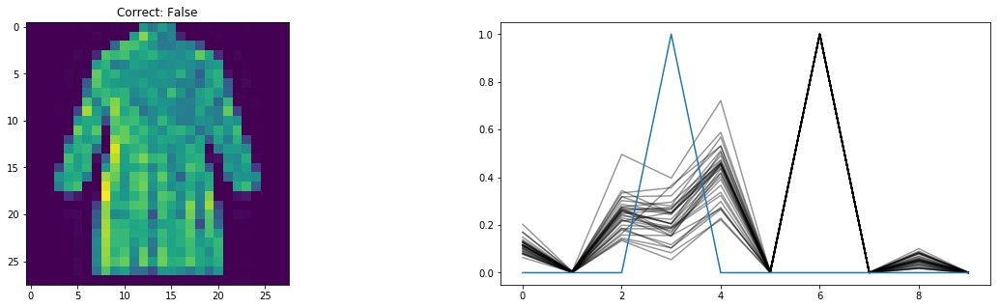

BAD PREDICTION


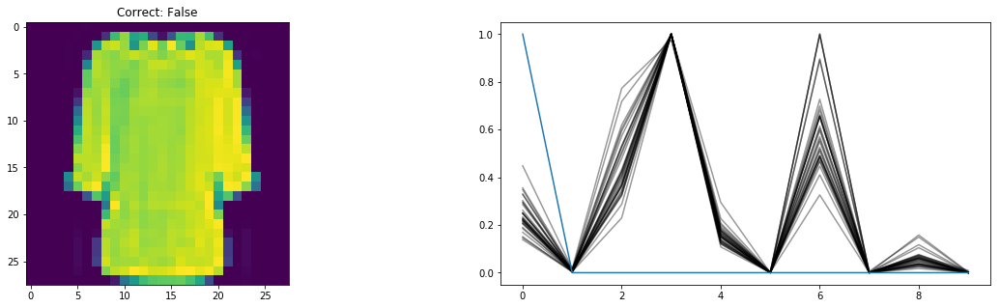

BAD PREDICTION


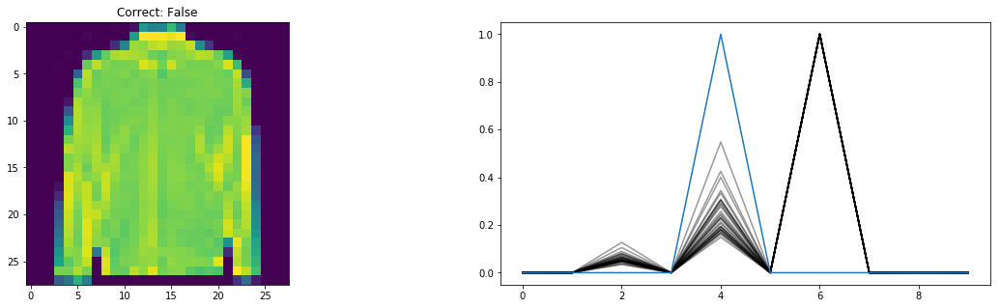

BAD PREDICTION


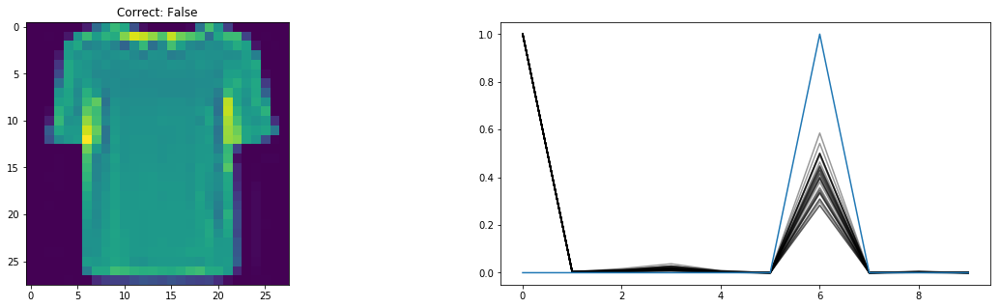

BAD PREDICTION


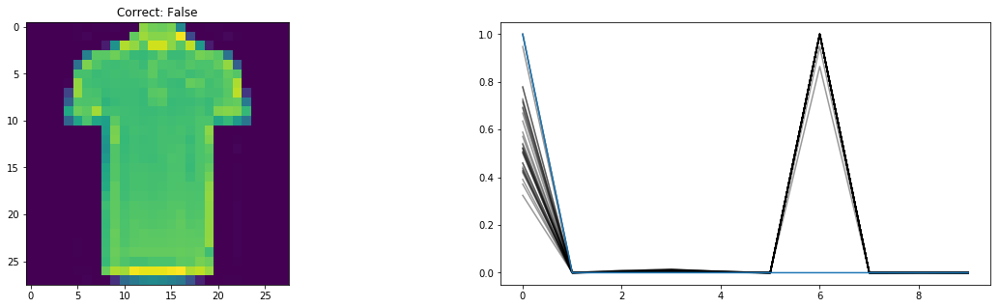

BAD PREDICTION


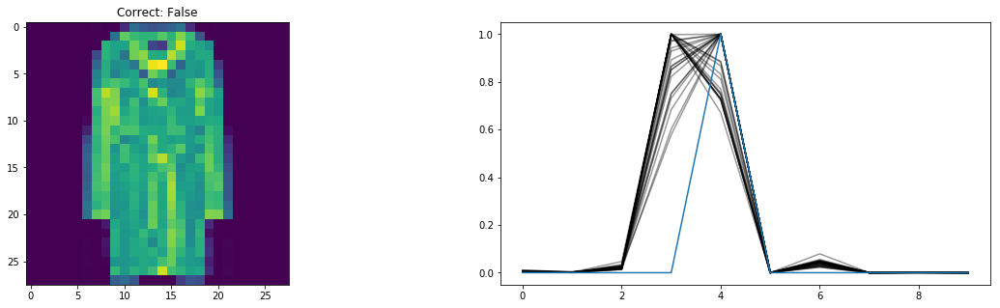

BAD PREDICTION


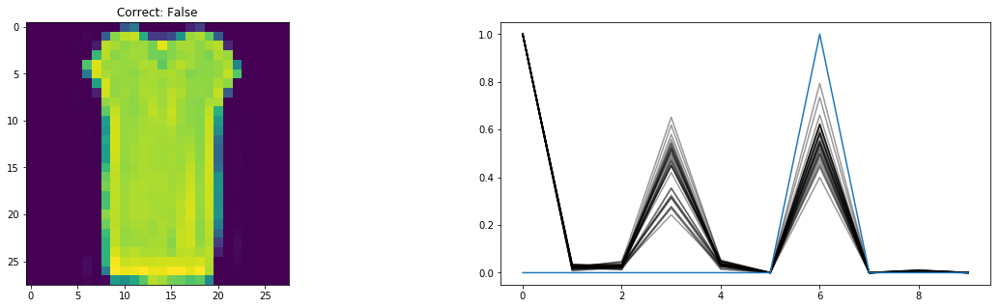

BAD PREDICTION


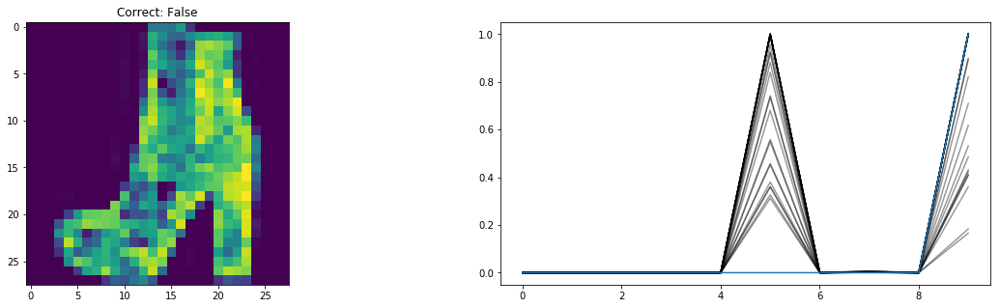

BAD PREDICTION


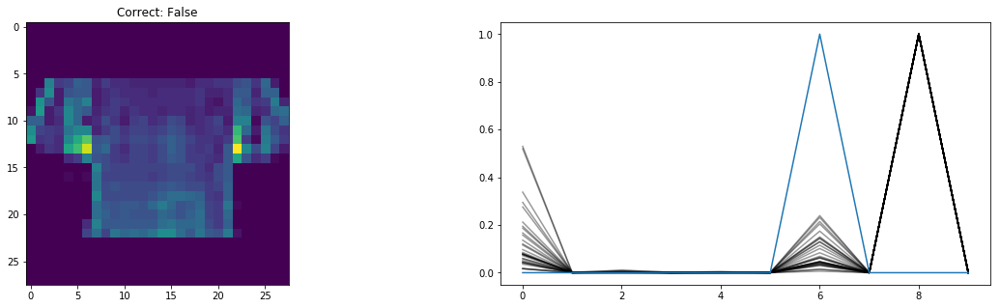

BAD PREDICTION


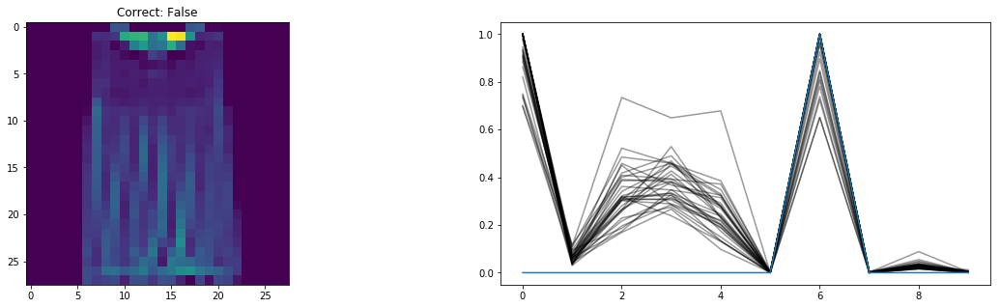

BAD PREDICTION


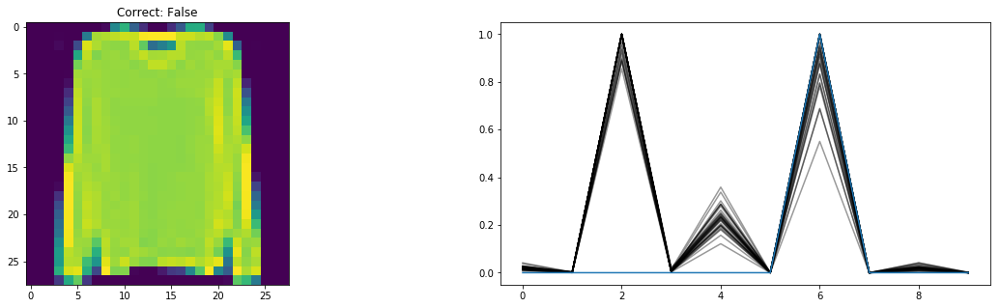

BAD PREDICTION


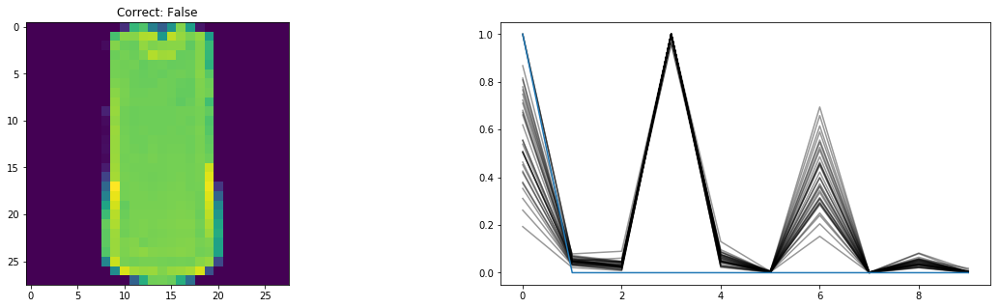

BAD PREDICTION


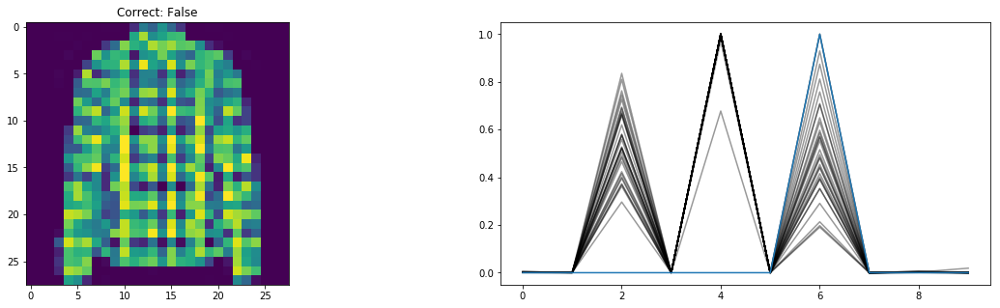

BAD PREDICTION


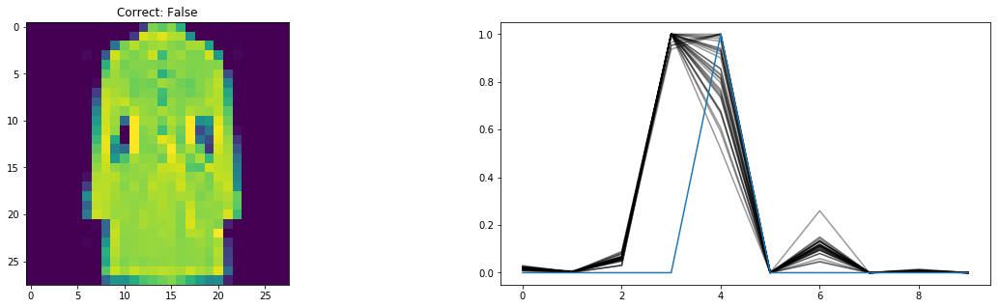

BAD PREDICTION


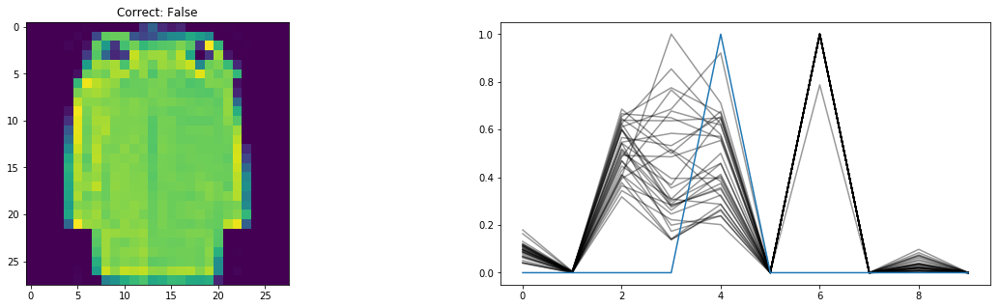

BAD PREDICTION


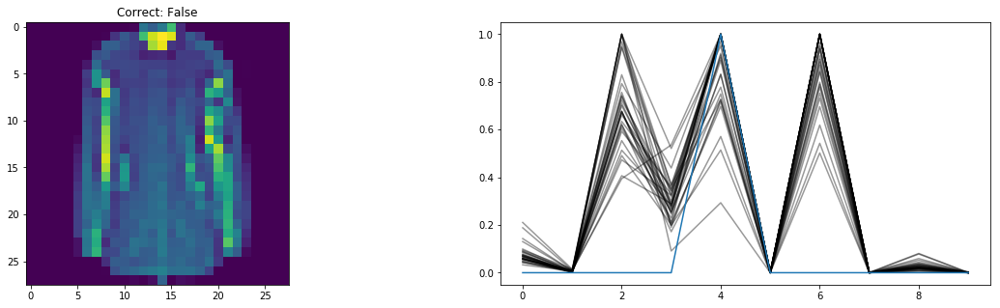

BAD PREDICTION


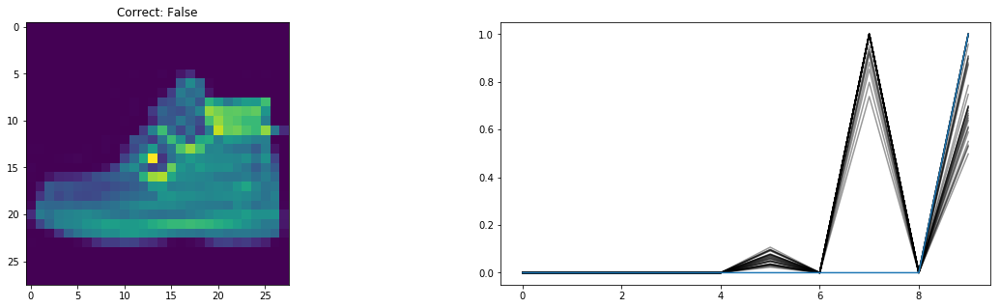

BAD PREDICTION


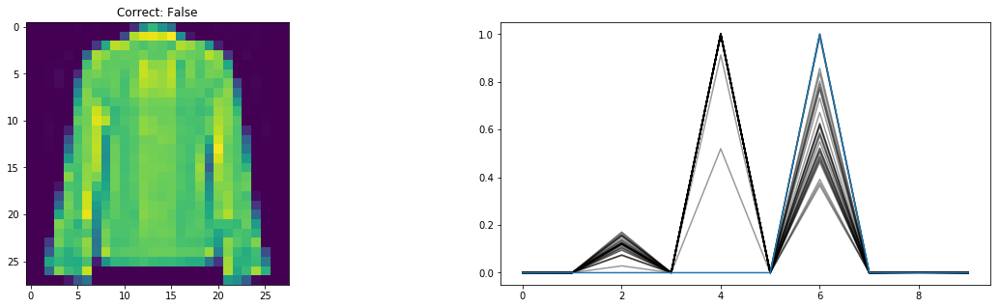

BAD PREDICTION


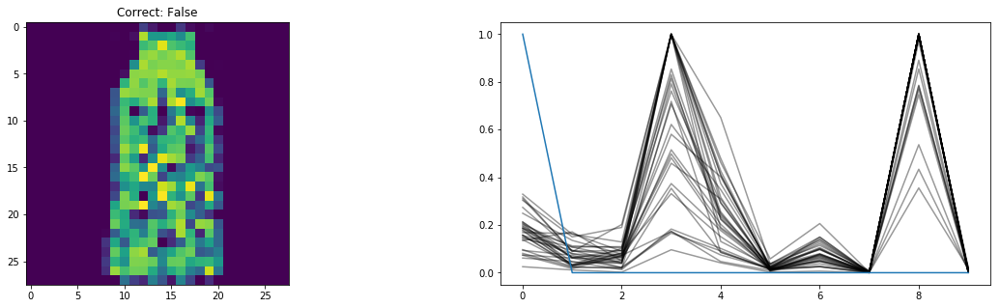

In [41]:
it = 0
total_it = 0
max_it = 50
while it < max_it:
    total_it += 1
    result = plot_predictions(
        sess,
        output_tensor=qx,
        x_input=x_input,
        mnist=fmnist,
        only_incorrect = True,
        reshape=[-1, 28, 28, 1],
        feed_dict={training_mode: False}
    )
    it += int(not result)

In [42]:
it, total_it, 1-it/total_it

(50, 343, 0.8542274052478134)

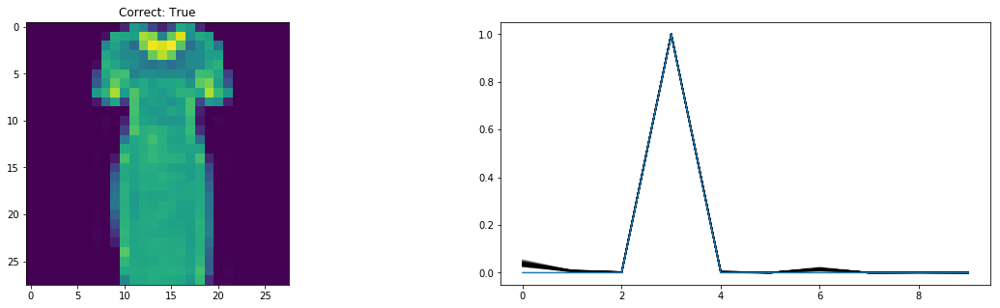

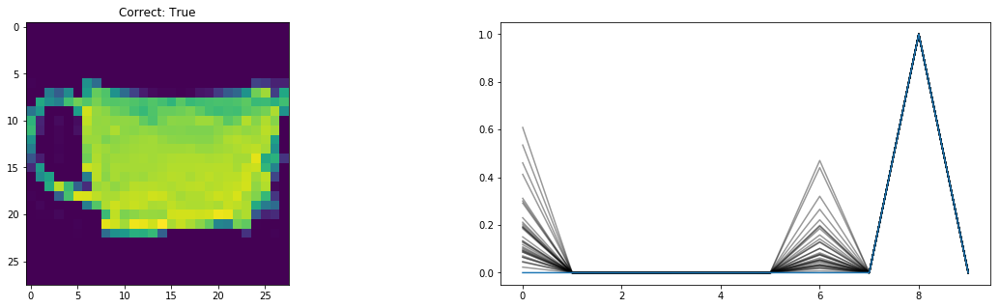

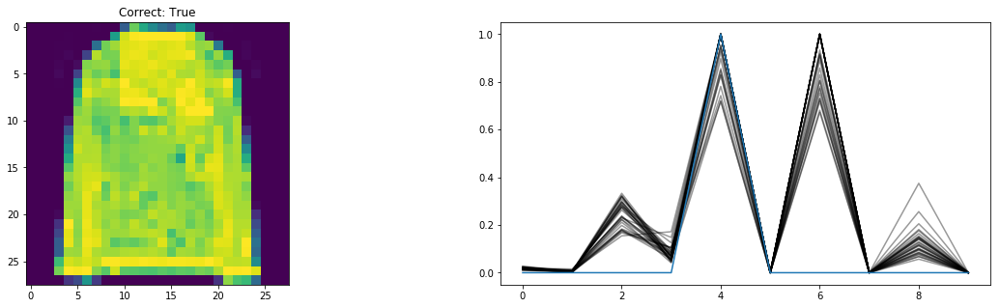

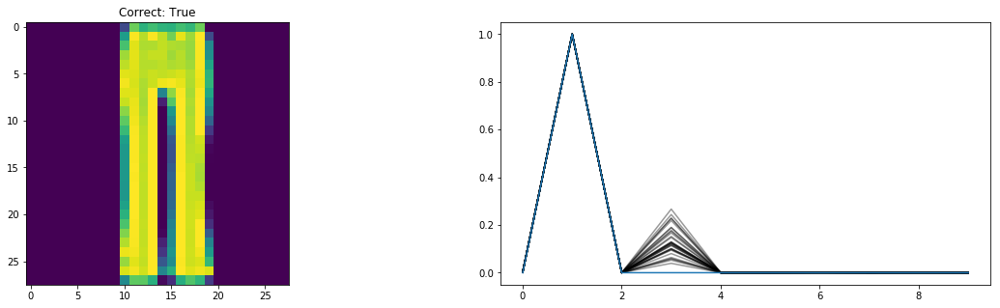

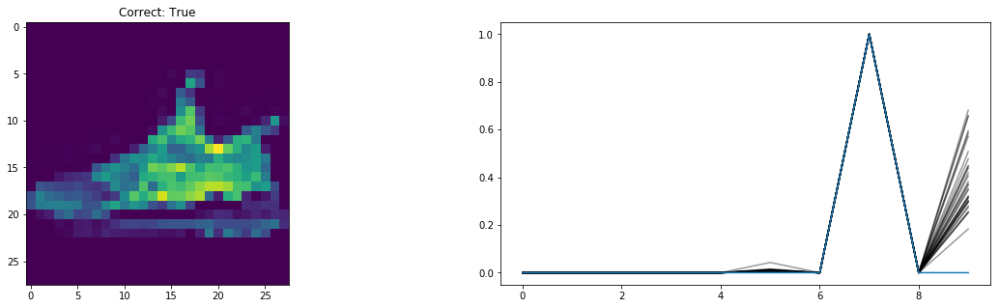

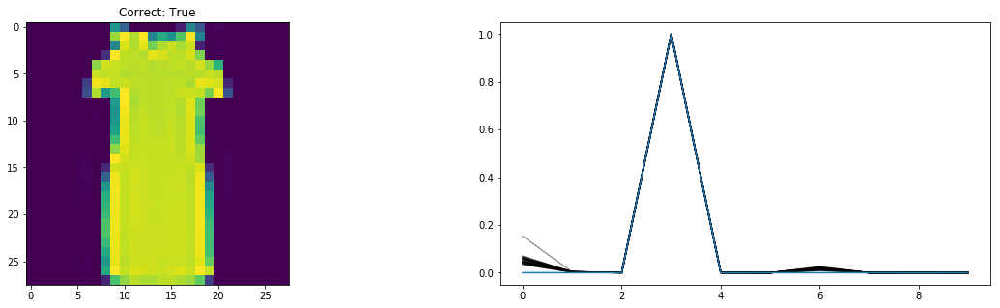

BAD PREDICTION


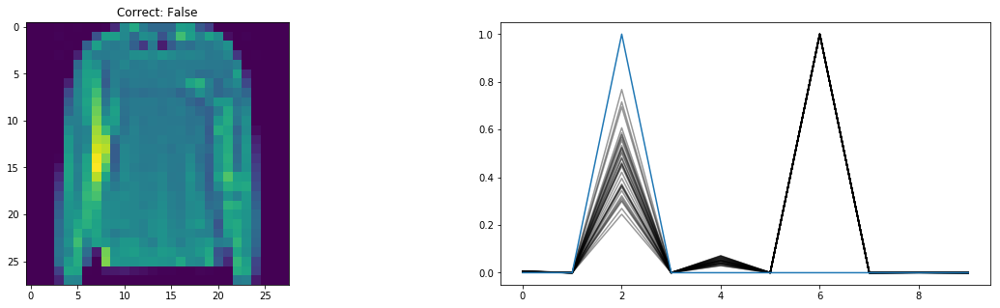

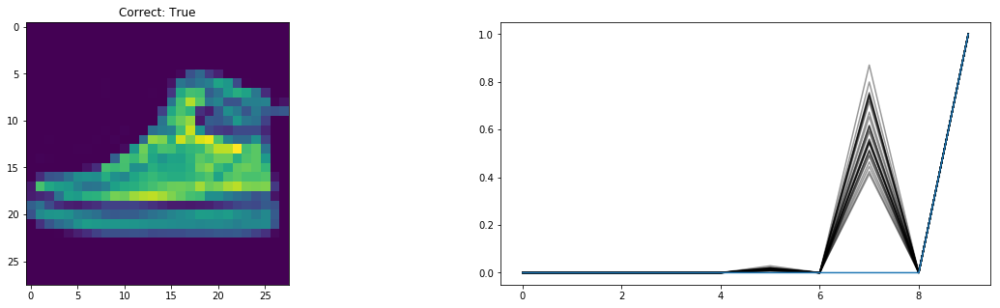

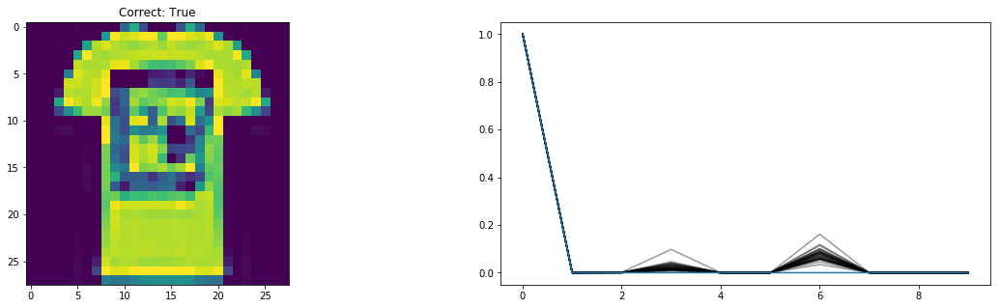

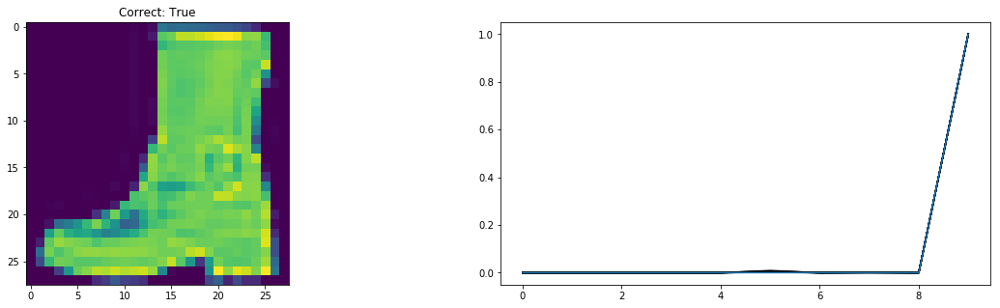

BAD PREDICTION


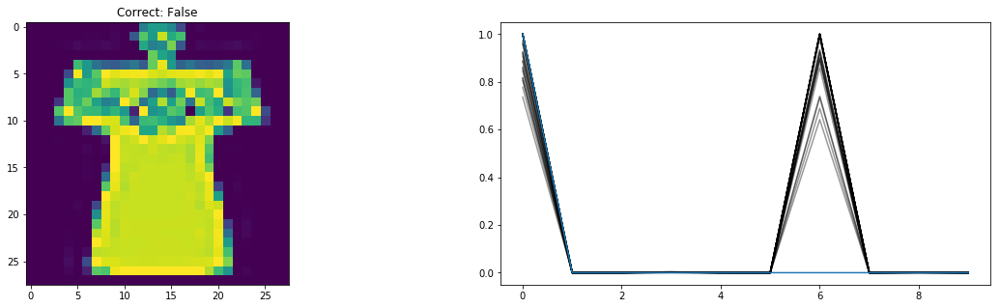

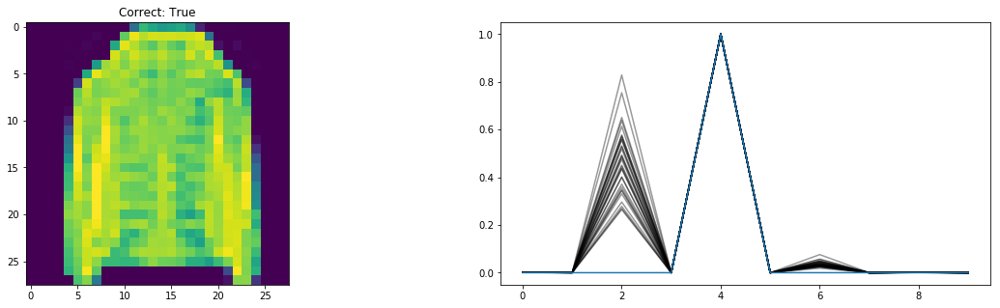

BAD PREDICTION


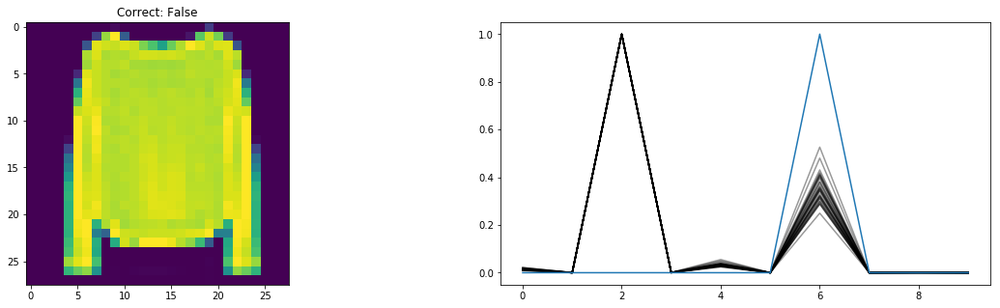

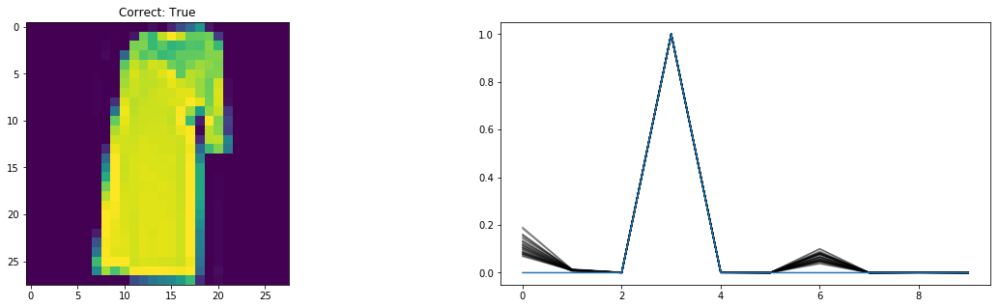

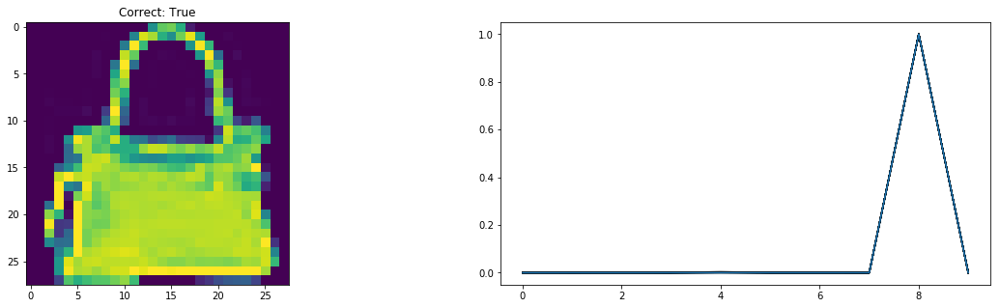

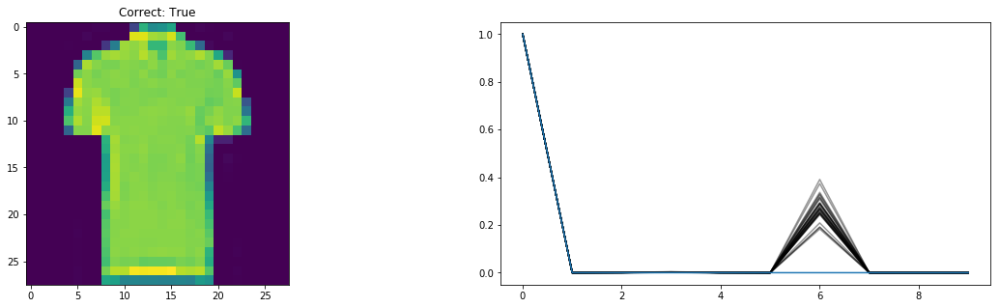

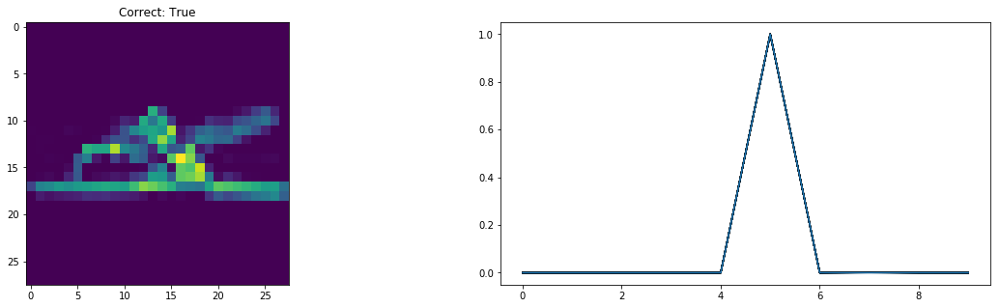

...

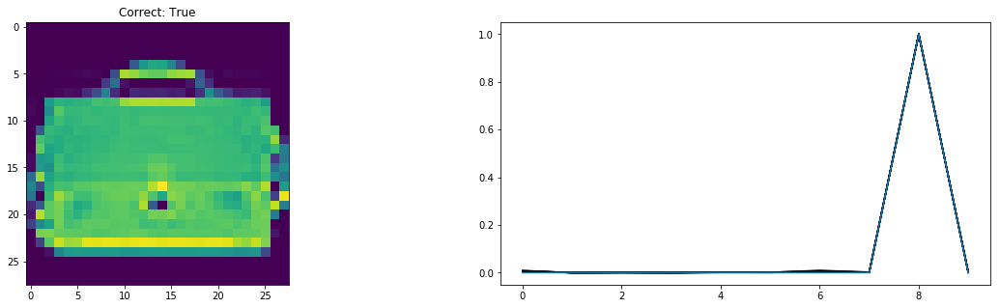

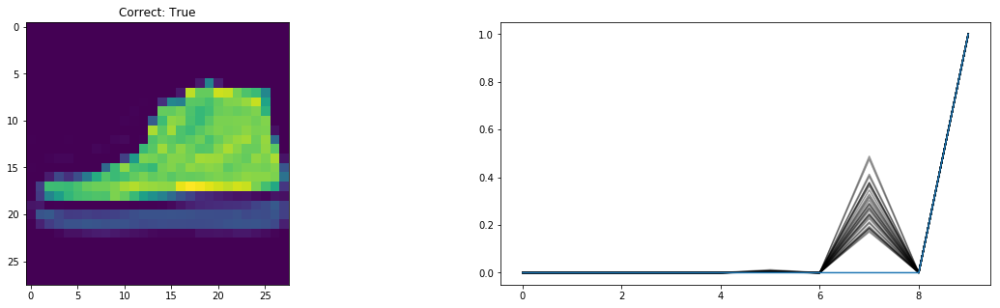

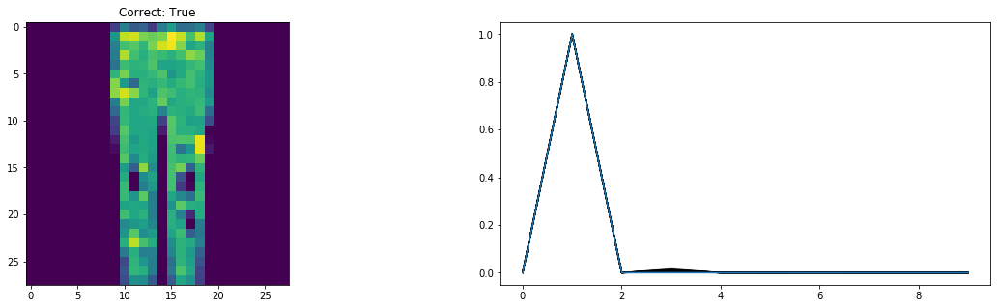

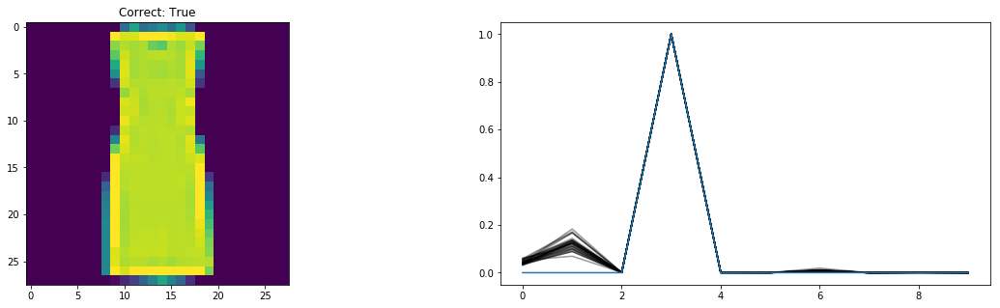

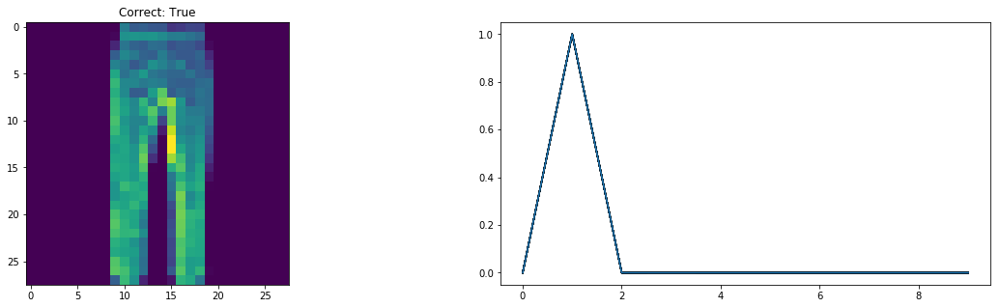

In [43]:
it = 0
max_it = 20
while it < max_it:
    total_it += 1
    result = plot_predictions(
        sess,
        output_tensor=qx,
        x_input=x_input,
        mnist=fmnist,
        only_incorrect = False,
        reshape=[-1, 28, 28, 1],
        feed_dict={training_mode: False}
    )
    it += int(result)

## Additionally with MCDropout

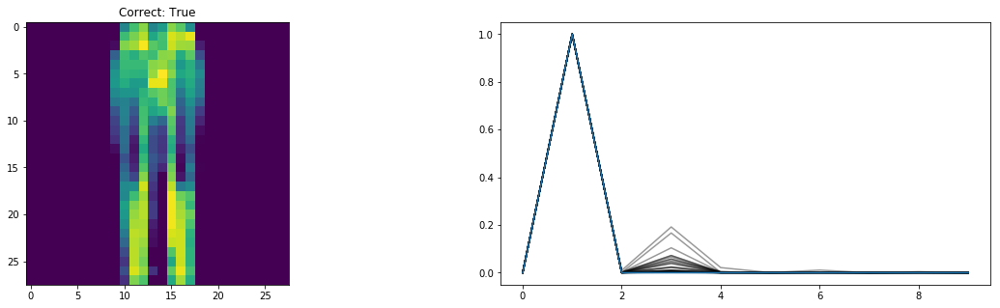

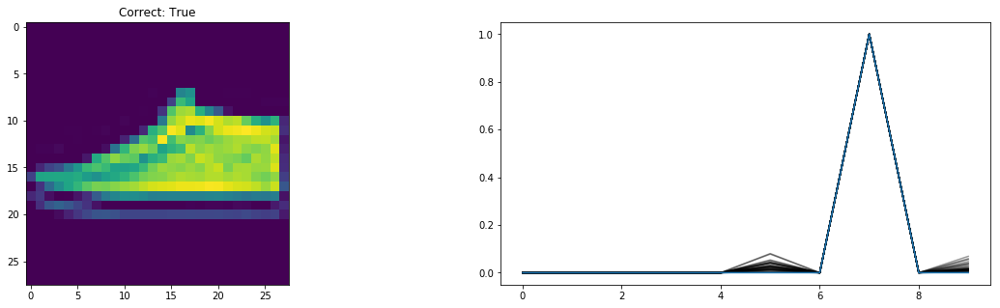

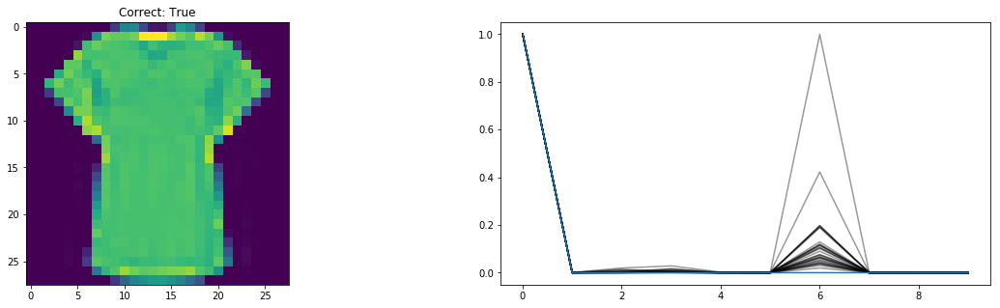

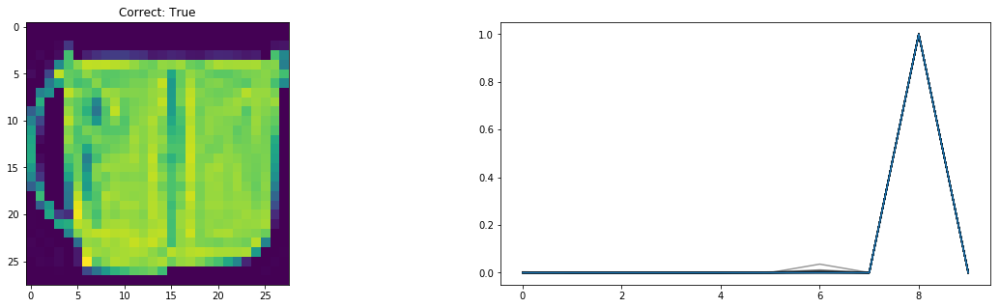

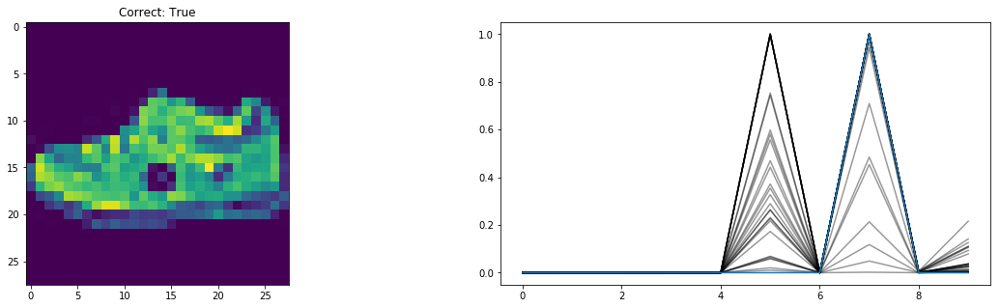

BAD PREDICTION


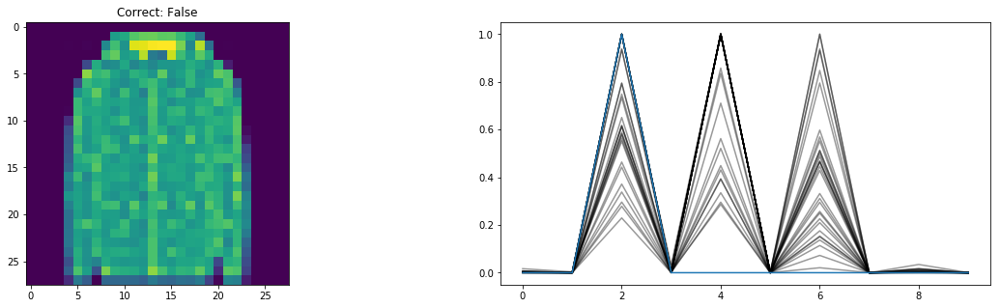

BAD PREDICTION


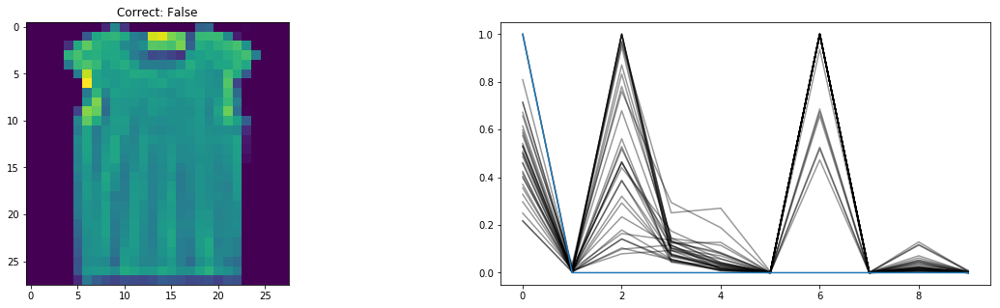

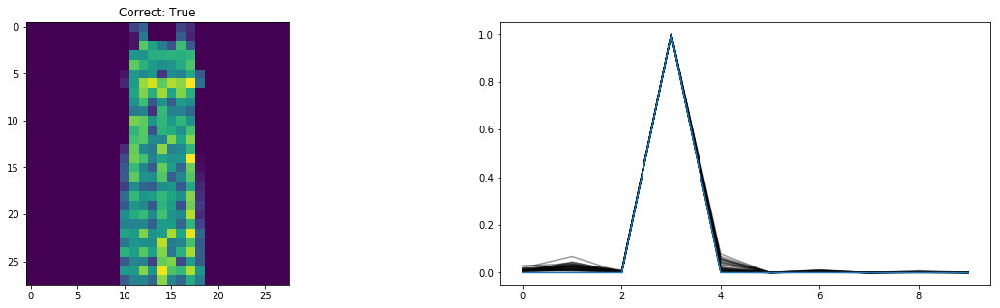

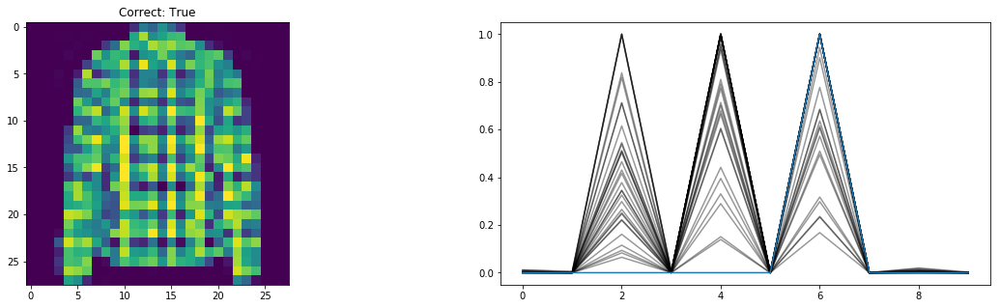

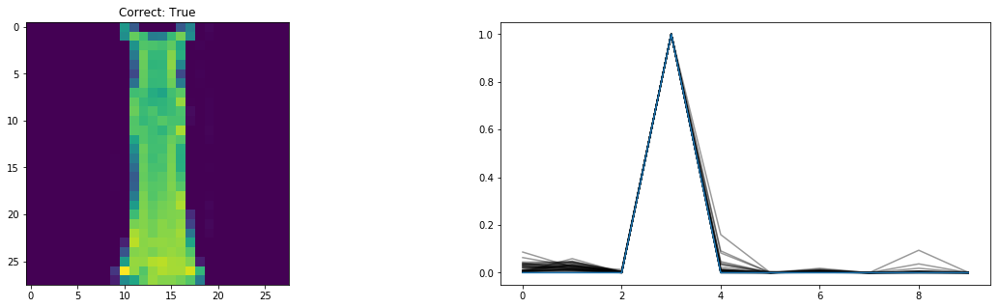

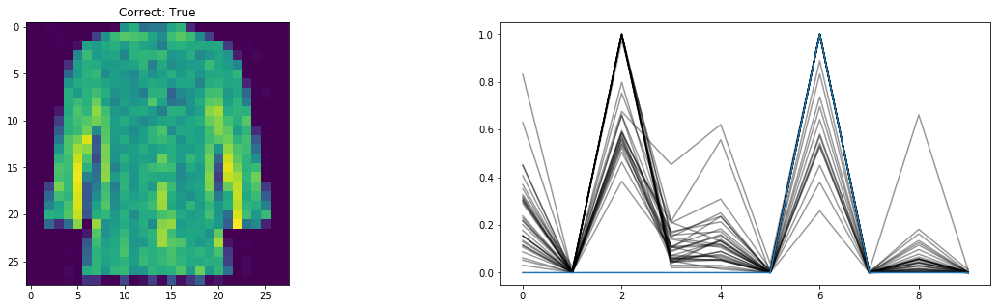

...

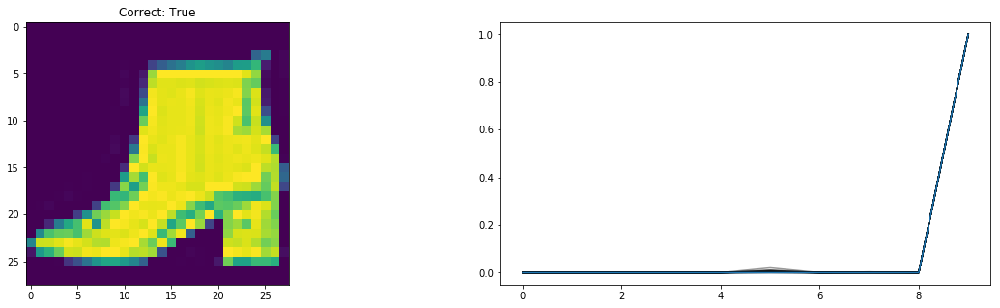

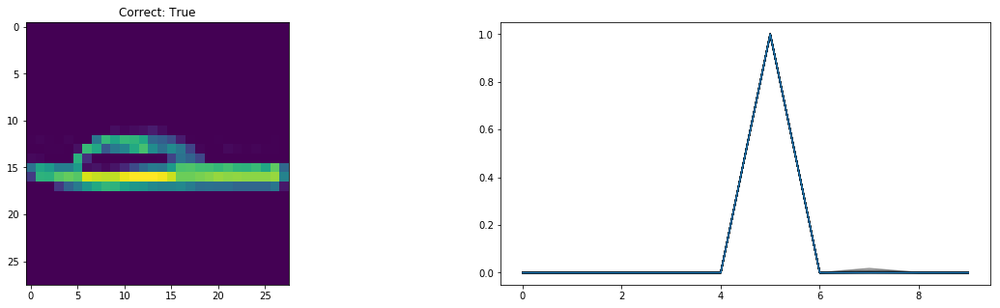

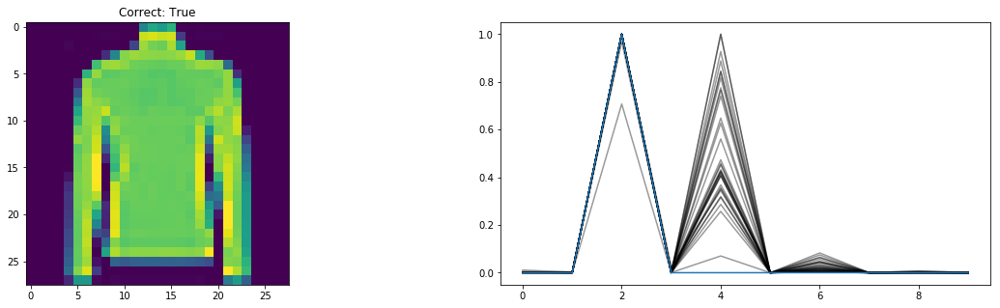

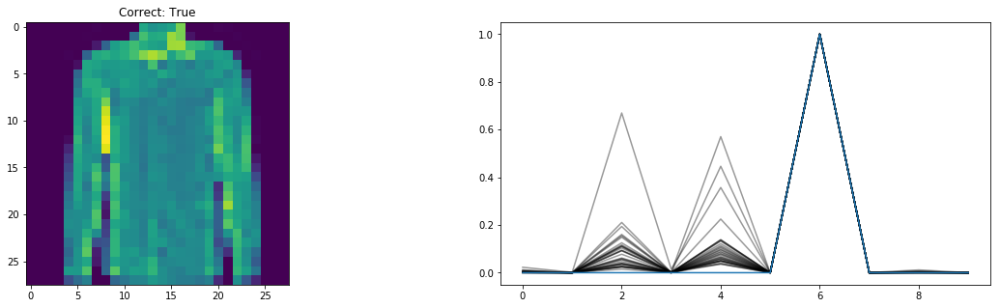

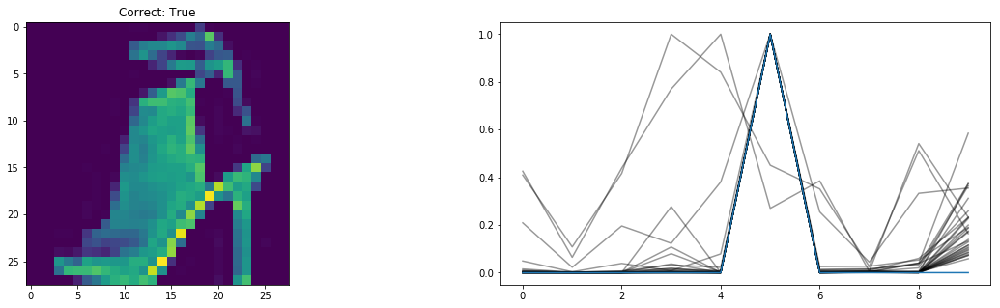

BAD PREDICTION


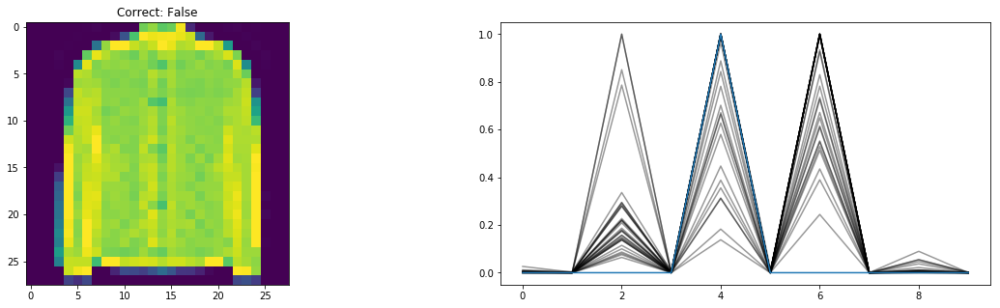

BAD PREDICTION


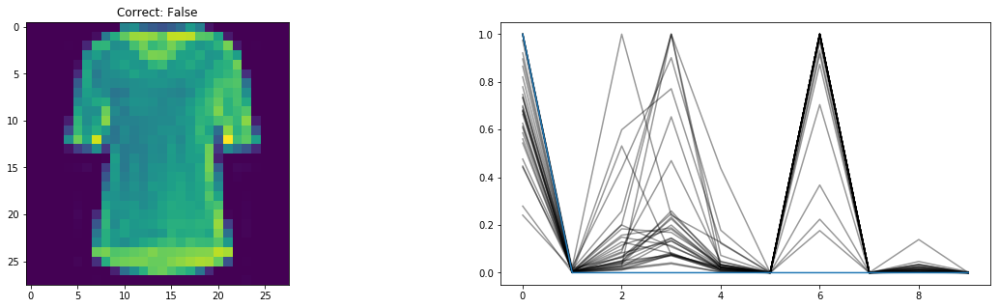

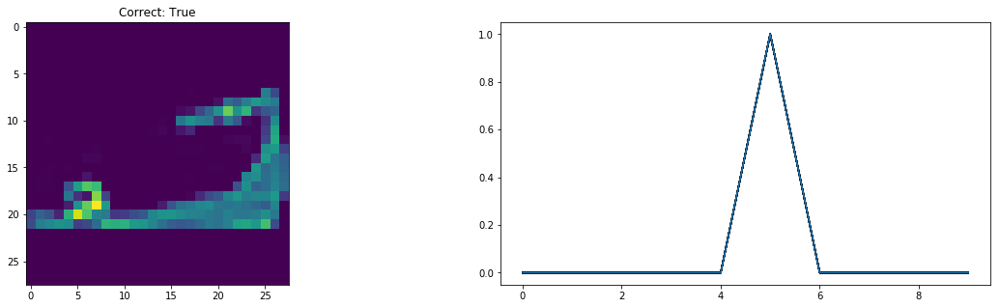

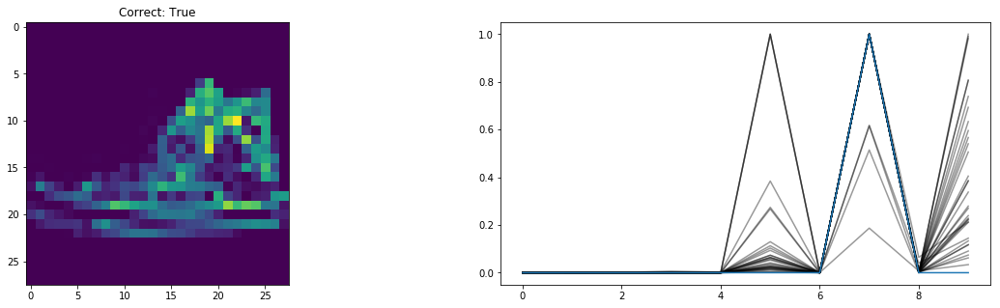

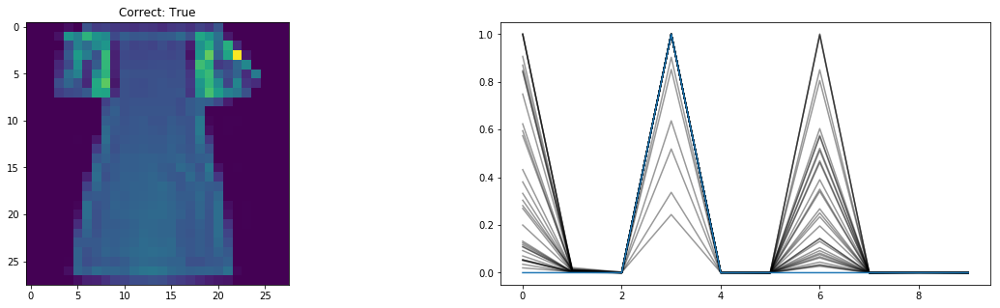

BAD PREDICTION


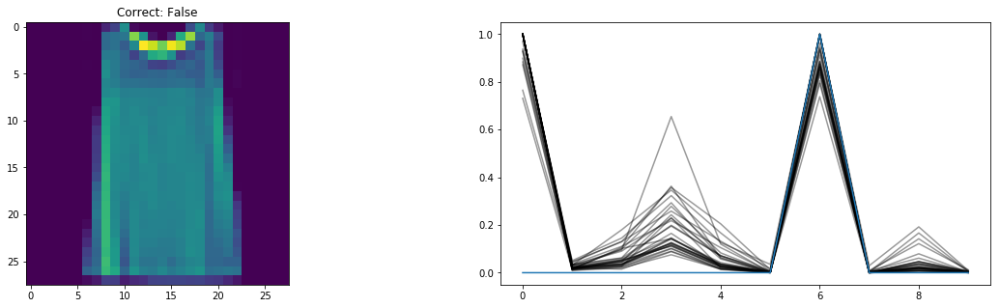

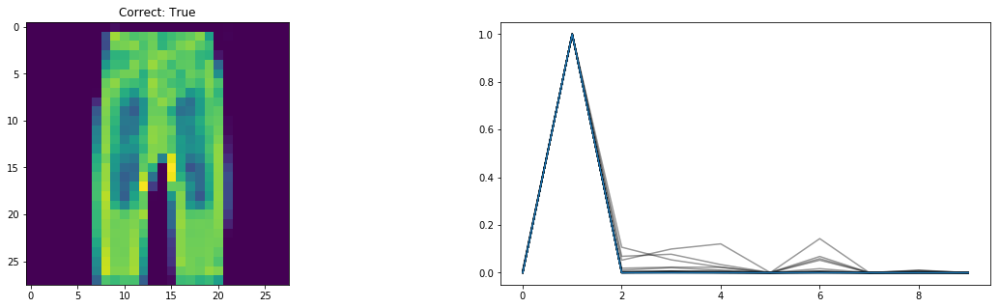

In [43]:
it = 0
max_it = 20
while it < max_it:
    total_it += 1
    result = plot_predictions(
        sess,
        output_tensor=qx,
        x_input=x_input,
        mnist=fmnist,
        only_incorrect = False,
        reshape=[-1, 28, 28, 1],
        feed_dict={training_mode: True}
    )
    it += int(result)